1st

In [1]:
!pip install gymnasium matplotlib numpy



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 6.7 MB/s eta 0:00:00


In [3]:

import gymnasium as gym
from gymnasium import spaces
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
import numpy as np
import random
import pickle



**PART-1**

**1.1**

Defining a deterministic environment

In [4]:
agent_pos  = [0,4] # mouse position
goal_pos   = [4,0] # cheese position
obs_pos    = [2,2] # obstacle position
cat_pos    = [3,0] # cat position
energy_pos = [4,2] # energy booster


In [5]:
n_states = 25
n_actions = 4
max_timesteps = 30

In [6]:
state_d = dict()
action_d = {0:'Down', 1: 'Up', 2: 'Right', 3: 'Left'}

k= 0
for i in range(5):
  for j in range(5):
    state_d[(i, j)]= k
    k+= 1

In [56]:
class GridEnvironmentwith_cat_cheese(gym.Env):
  metadata = {'render.modes':[]}

  def __init__(self):
    self.observation_space = spaces.Discrete(n_states)
    self.action_space = spaces.Discrete(n_actions)
    self.max_timesteps = max_timesteps

    self.timestep = 0
    self.agent_pos  = [0,4] # mouse position
    self.goal_pos   = [4,0] # cheese position
    self.obs_pos    = [2,2] # obstacle position
    self.cat_pos    = [3,0] # cat position
    self.energy_pos = [4,2] # energy booster

    self.state = np.zeros((5,5))
    self.state[tuple(self.agent_pos)] = 1
    self.state[tuple(self.goal_pos)]  = 6
    self.state[tuple(self.obs_pos)]   = 5
    self.state[tuple(self.cat_pos)]   = 3
    self.state[tuple(self.energy_pos)]   = 4

    self.energy_taken = False

  def reset(self, **kwargs):

    self.timestep = 0
    self.agent_pos = [0, 4]  # mouse position
    self.goal_pos = [4, 0]  # cheese position
    self.obs_pos = [2, 2]  # obstacle position
    self.cat_pos = [3, 0]  # cat position
    self.energy_pos = [4, 2]  # energy booster

    self.state = np.zeros((5,5))
    self.state[tuple(self.agent_pos)] = 1
    self.state[tuple(self.goal_pos)]  = 6
    self.state[tuple(self.obs_pos)]   = 5
    self.state[tuple(self.cat_pos)]   = 3
    self.state[tuple(self.energy_pos)]   = 4
    #observation =  self.state.flatten()
    #info = {}
    agent_state = self.agent_pos
    self.energy_taken = False


    return state_d[tuple(agent_state)]

  def step(self, action):

    if action == 0 : #down
      self.agent_pos[0] += 1
    if action ==1: #up
      self.agent_pos[0] -= 1
    if action ==2: #right
      self.agent_pos[1] += 1
    if action ==3: #left
      self.agent_pos[1] -= 1

    # in this function we can write more actions such as going digonally and jumping from one place to another

    #check if the agent is hitting the obstacle


    self.agent_pos = np.clip(self.agent_pos, 0 ,4 )


    self.state = np.zeros((5,5))
    self.state[tuple(self.agent_pos)] = 1
    self.state[tuple(self.goal_pos)]  = 6
    self.state[tuple(self.obs_pos)]   = 5
    self.state[tuple(self.cat_pos)]   = 3
    self.state[tuple(self.energy_pos)]   = 4
    #observation =  self.state.flatten()

    agent_state = self.agent_pos

    reward = 0
    if np.array_equal(self.agent_pos, self.goal_pos):
      reward  =+ 20 # when mouse eats cheese
    elif np.array_equal(self.agent_pos,self.obs_pos):
      reward = -0.5 # when mouse hits obsticale
    elif np.array_equal(self.agent_pos,self.cat_pos):
      reward = -4 # when mouse gets caught by cat

    elif np.array_equal(self.agent_pos, self.energy_pos) and not self.energy_taken:
        reward += 3  # additional reward when the mouse reaches the energy booster
        self.energy_taken = True


    self.timestep+=1 # incrementing time steps

    #terminated = True if self.timestep >= self.max_timesteps else False
    #truncated  = True if np.all((np.asarray(self.agent_pos)>=0)& (np.asarray(self.agent_pos)<=4)) else False
    #return observation, reward, terminated, truncated, info

    done= True if ((self.timestep >= self.max_timesteps) or (self.agent_pos == self.goal_pos).all()) else False
    info= {}

    return state_d[tuple(agent_state)], reward,done, info

  def render(self):
          plt.imshow(plt.imread('/content/drive/MyDrive/RL_models/tj.jpeg'), extent=[0, 5, 0, 5])  # Change '/path/to/your/background/image.jpg' to your image path
          plt.title('Grid Environment')

          # Define the width and height of each grid cell
          cell_width = 1
          cell_height = 1

          # Create an empty list to store the image annotations
          image_annotations = []

          # Load images for each entity
          images = {
              1: plt.imread('/content/drive/MyDrive/RL_models/mouse Background Removed.png'),  # Agent
              6: plt.imread('/content/drive/MyDrive/RL_models/cheese Background Removed.png'),  # Goal
              5: plt.imread('/content/drive/MyDrive/RL_models/obstacle  Background Removed.png'),  # Obstacle
              3: plt.imread('/content/drive/MyDrive/RL_models/cat Background Removed.png'),  # Cat
              4: plt.imread('/content/drive/MyDrive/RL_models/energy_booster Background Removed.png')  # Energy
          }

          # Iterate through positions and create image annotations
          for i in range(5):
              for j in range(5):
                  # Check if the state exists in images dictionary
                  if self.state[i, j] in images:
                      entity = self.state[i, j]
                      image = images[entity]
                      # Calculate the center position of the grid cell
                      pos = (j + 0.5, 5 - i - 0.5)  # Invert y-axis

                      ab = AnnotationBbox(OffsetImage(image, zoom=0.2), pos, frameon=False)
                      image_annotations.append(ab)

          # Add all image annotations to the plot
          for ab in image_annotations:
              plt.gca().add_artist(ab)

          # Add grid lines
          for i in range(6):
              plt.axhline(y=i, color='black', linestyle='-')
              plt.axvline(x=i, color='black', linestyle='-')

          plt.show()









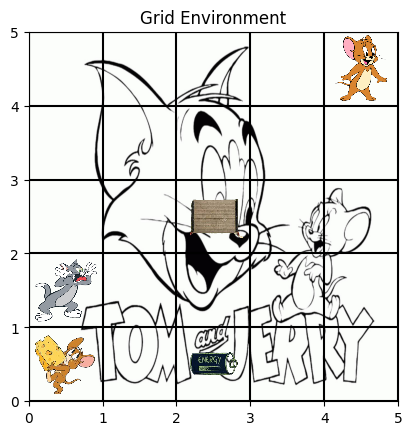

In [57]:

env =  GridEnvironmentwith_cat_cheese()

terminated, truncated = False, False
state = env.reset()
env.render()

In [44]:

class RandomAgent_d:

  def __init__(self, env):
    self.env = env
    self.observation_space = env.observation_space
    self.action_space = env.action_space

  def step(self, obs):
    """Takes a step in the environment by choosing an action randomly.

    Args:
        obs: The current observation.

    Returns:
        The action to take.
    """
    return np.random.choice(self.action_space.n)

Current_state: 4 Action: 2 , Reward: 0 , Done: False


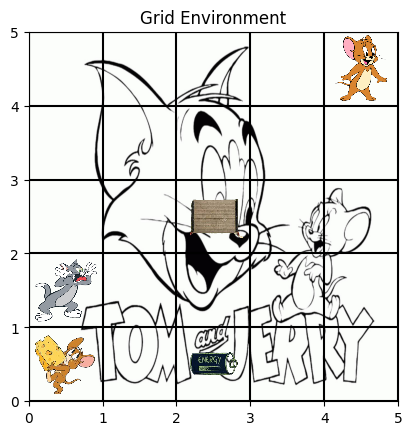

Current_state: 9 Action: 0 , Reward: 0 , Done: False


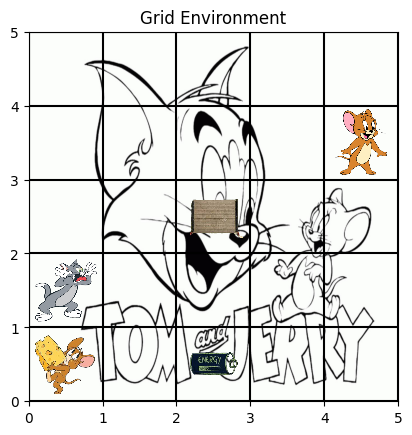

Current_state: 9 Action: 2 , Reward: 0 , Done: False


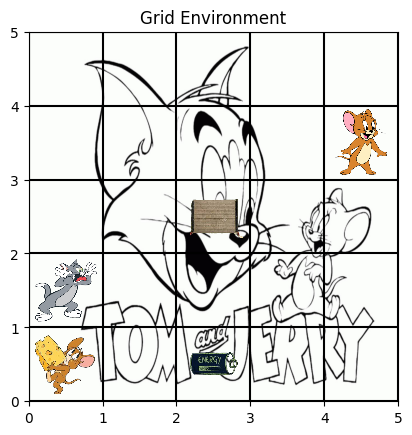

Current_state: 8 Action: 3 , Reward: 0 , Done: False


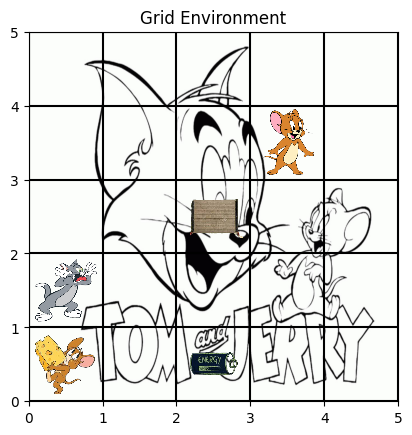

Current_state: 3 Action: 1 , Reward: 0 , Done: False


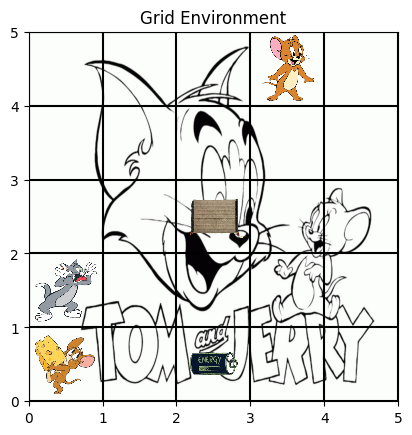

Current_state: 3 Action: 1 , Reward: 0 , Done: False


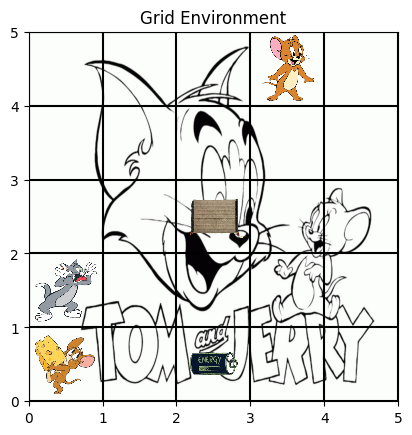

Current_state: 8 Action: 0 , Reward: 0 , Done: False


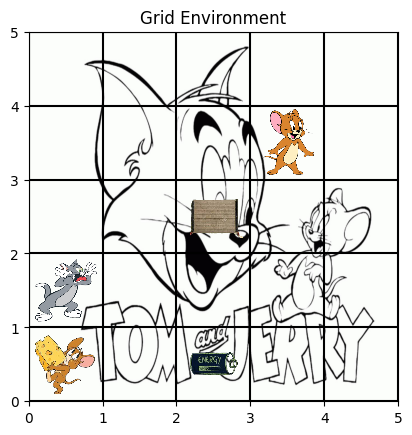

Current_state: 7 Action: 3 , Reward: 0 , Done: False


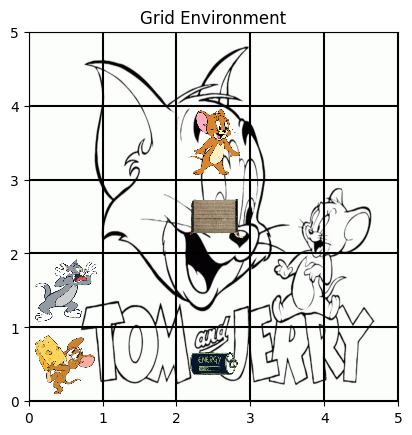

Current_state: 12 Action: 0 , Reward: -0.5 , Done: False


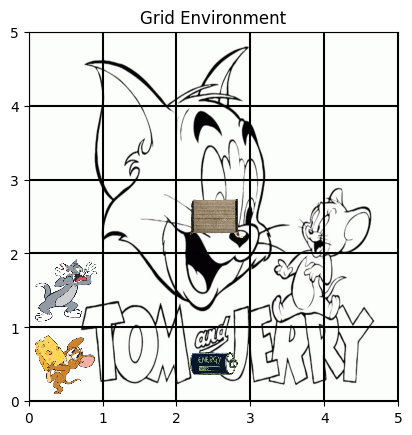

Current_state: 13 Action: 2 , Reward: 0 , Done: False


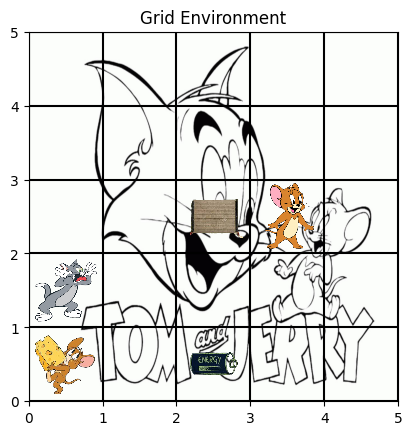

Current_state: 8 Action: 1 , Reward: 0 , Done: False


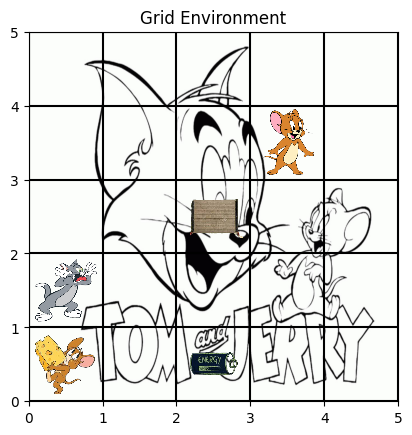

Current_state: 3 Action: 1 , Reward: 0 , Done: False


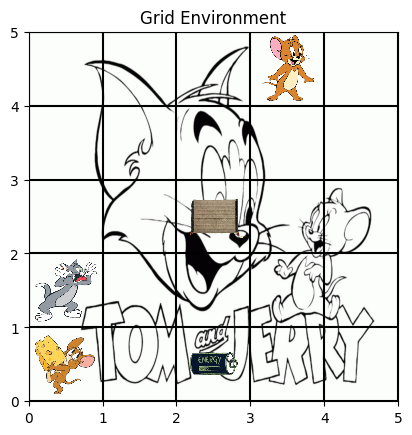

Current_state: 8 Action: 0 , Reward: 0 , Done: False


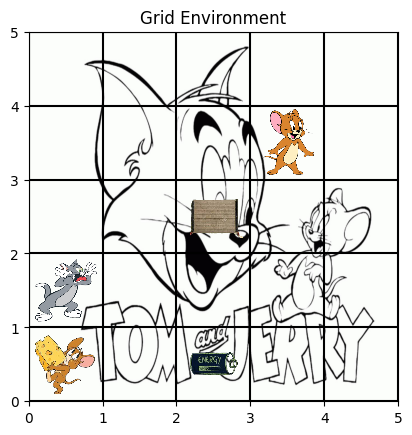

Current_state: 13 Action: 0 , Reward: 0 , Done: False


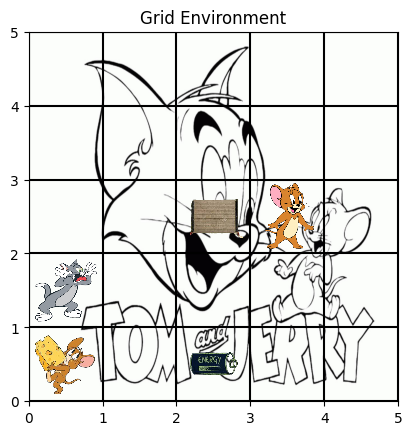

Current_state: 8 Action: 1 , Reward: 0 , Done: False


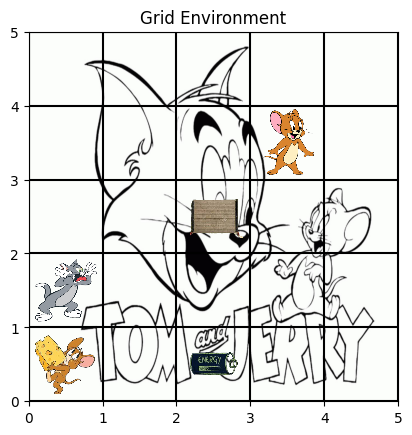

Current_state: 13 Action: 0 , Reward: 0 , Done: False


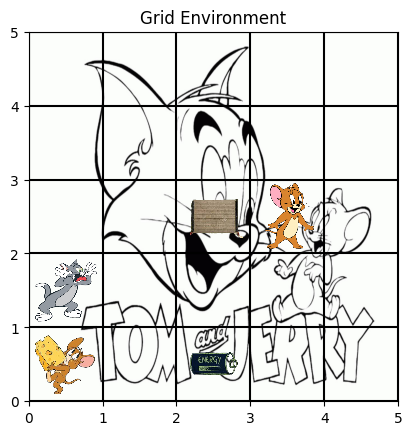

Current_state: 8 Action: 1 , Reward: 0 , Done: False


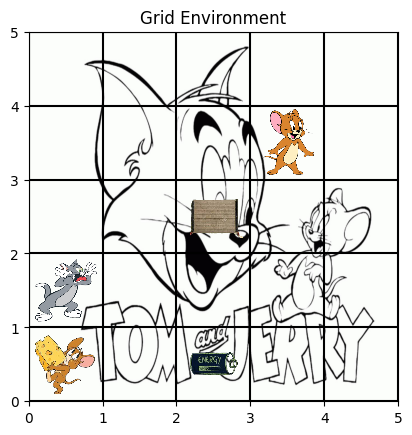

Current_state: 13 Action: 0 , Reward: 0 , Done: False


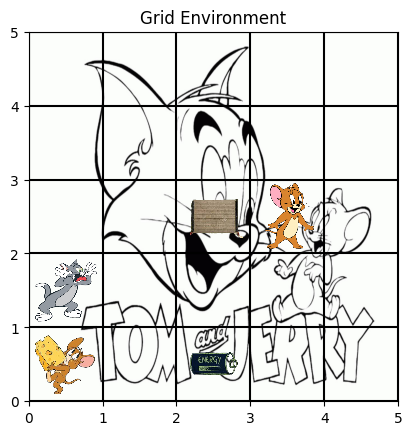

Current_state: 18 Action: 0 , Reward: 0 , Done: False


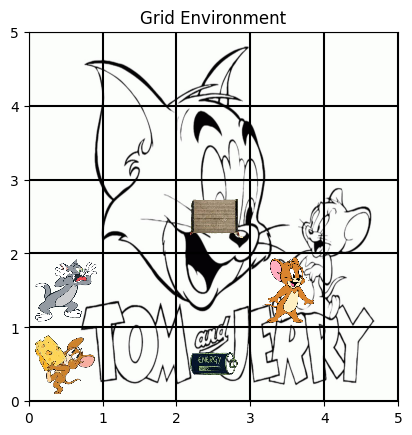

Current_state: 17 Action: 3 , Reward: 0 , Done: False


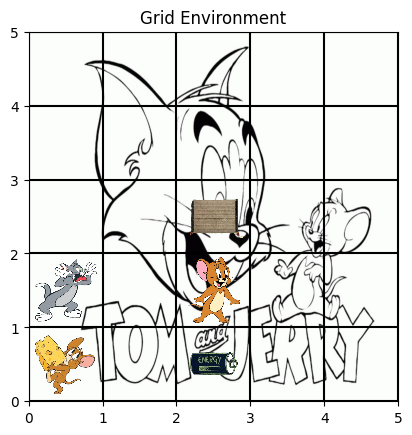

Current_state: 18 Action: 2 , Reward: 0 , Done: False


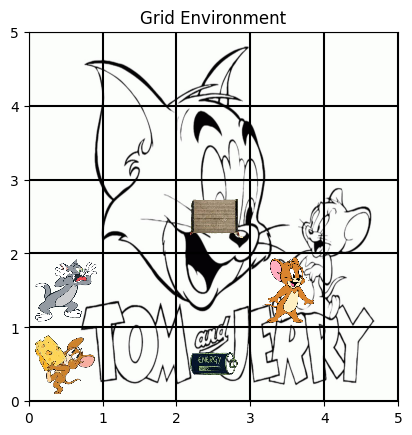

Current_state: 17 Action: 3 , Reward: 0 , Done: False


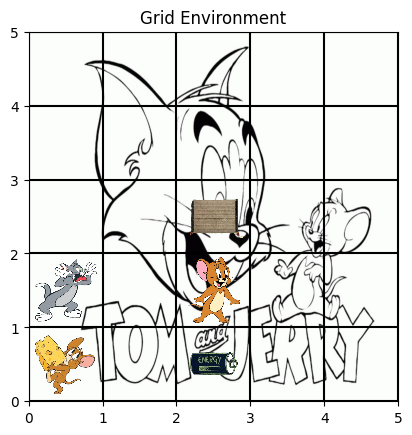

Current_state: 16 Action: 3 , Reward: 0 , Done: False


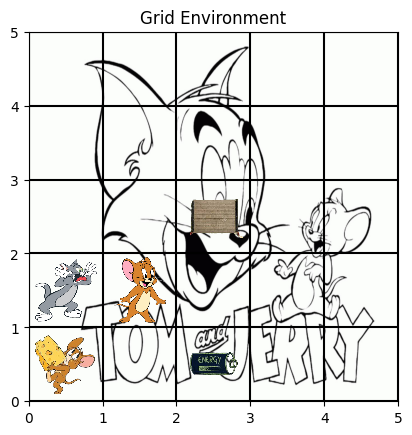

Current_state: 17 Action: 2 , Reward: 0 , Done: False


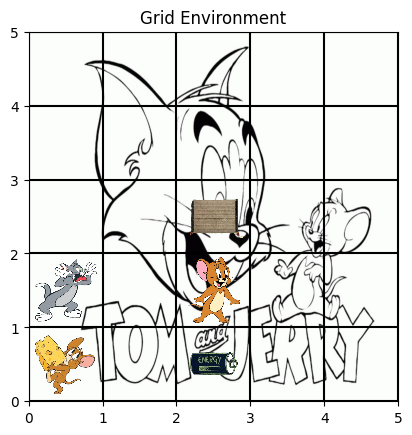

Current_state: 16 Action: 3 , Reward: 0 , Done: False


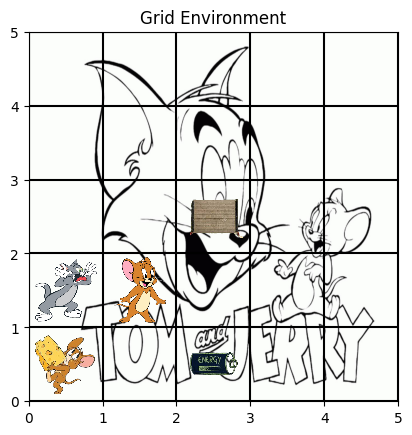

Current_state: 21 Action: 0 , Reward: 0 , Done: False


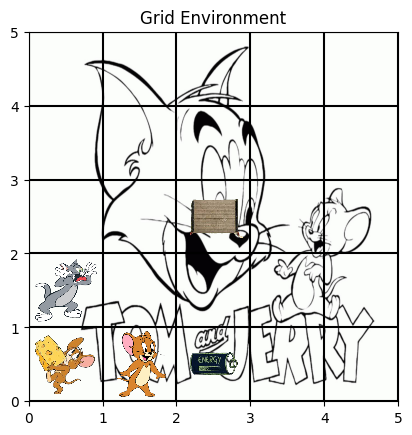

Current_state: 20 Action: 3 , Reward: 20 , Done: True


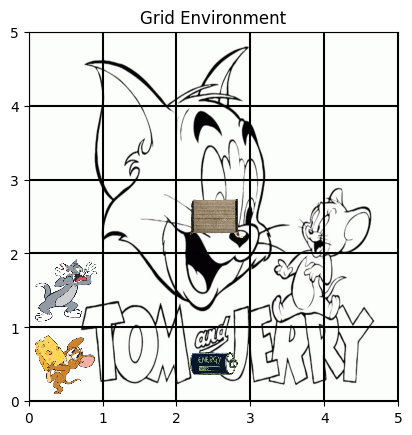

Agent has reached the Goal position


In [45]:
if __name__ == '__main__':
  env = GridEnvironmentwith_cat_cheese()
  agent = RandomAgent_d(env)

  state= env.reset()
  done = False


  while not done:
    action = agent.step(state)
    next_state, reward, done, info = env.step(action)
    print('Current_state:',next_state,'Action:', action, ', Reward:', reward, ', Done:', done)
    env.render()
  if done == True and env.timestep < max_timesteps:
    print('Agent has reached the Goal position')
  elif done == True and env.timestep == max_timesteps:
    print('Agent ran out of time')

**1.2**

StochasticGridEnvironment

In [48]:
import numpy as np
import gym
from gym import spaces
import matplotlib.pyplot as plt

class StochasticGridEnvironment(gym.Env):
    metadata = {'render.modes': []}

    def __init__(self):
        self.observation_space = spaces.Discrete(n_states)
        self.action_space = spaces.Discrete(n_actions)
        self.max_timesteps = max_timesteps

        self.timestep = 0
        self.agent_pos = [0, 4]  # mouse position
        self.goal_pos = [4, 0]  # cheese position
        self.obs_pos = [2, 2]  # obstacle position
        self.cat_pos = [3, 0]  # cat position
        self.energy_pos = [4, 2]  # energy booster

        self.state = np.zeros((5, 5))
        self.state[tuple(self.agent_pos)] = 1
        self.state[tuple(self.goal_pos)] = 6
        self.state[tuple(self.obs_pos)] = 5
        self.state[tuple(self.cat_pos)] = 3
        self.state[tuple(self.energy_pos)] = 4

        self.energy_taken = False



    def reset(self, **kwargs):

        self.timestep = 0
        self.agent_pos = [0, 4]  # mouse position
        self.goal_pos = [4, 0]  # cheese position
        self.obs_pos = [2, 2]  # obstacle position
        self.cat_pos = [3, 0]  # cat position
        self.energy_pos = [4, 2]  # energy booster

        self.state = np.zeros((5, 5))
        self.state[tuple(self.agent_pos)] = 1
        self.state[tuple(self.goal_pos)] = 6
        self.state[tuple(self.obs_pos)] = 5
        self.state[tuple(self.cat_pos)] = 3
        self.state[tuple(self.energy_pos)] = 4

        self.energy_taken = True
        #observation = self.state.flatten()
        agent_state = self.agent_pos

        #info = {}

        return state_d[tuple(agent_state)]

    def step(self, action):
        # Define transition probabilities for stochasticity

        action = action if np.random.uniform(0, 1) < 0.15 else np.random.choice(self.action_space.n)

        # Update agent's position based on the chosen action and transition probabilities
        #prob = self.transition_probs[action]
        #next_move = np.random.choice(range(len(prob)), p=prob)

        if action == 0 : #down
          self.agent_pos[0] += 1
        if action ==1: #up
          self.agent_pos[0] -= 1
        if action ==2: #right
          self.agent_pos[1] += 1
        if action ==3: #left
          self.agent_pos[1] -= 1

        self.agent_pos= np.clip(self.agent_pos, 0, 4)



        self.state = np.zeros((5, 5))
        self.state[tuple(self.agent_pos)] = 1
        self.state[tuple(self.goal_pos)] = 6
        self.state[tuple(self.obs_pos)] = 5
        self.state[tuple(self.cat_pos)] = 3
        self.state[tuple(self.energy_pos)] = 4

        agent_state = self.agent_pos

        reward = 0
        if np.array_equal(self.agent_pos, self.goal_pos):
            reward = +20  # when mouse eats cheese
        elif np.array_equal(self.agent_pos, self.obs_pos):
            reward = -0.5  # when mouse hits obstacle
        elif np.array_equal(self.agent_pos, self.cat_pos):
            reward = -4  # when mouse gets caught by cat
        elif np.array_equal(self.agent_pos, self.energy_pos) and  not self.energy_taken:
            reward += 3  # additional reward when the mouse reaches the energy booster
            self.energy_taken = True

        self.timestep += 1  # incrementing time steps

        done= True if ((self.timestep >= self.max_timesteps) or (self.agent_pos == self.goal_pos).all()) else False
        info= {}

        return state_d[tuple(agent_state)], reward,done, info

    def is_terminal(self, state):
        #Check if the given state is a terminal state
        return np.array_equal(self.agent_pos, self.goal_pos) or self.timestep >= self.max_timesteps


    def render(self):
          plt.imshow(plt.imread('/content/drive/MyDrive/RL_models/tj.jpeg'), extent=[0, 5, 0, 5])  # Change '/path/to/your/background/image.jpg' to your image path
          plt.title('Grid Environment')

          # Define the width and height of each grid cell
          cell_width = 1
          cell_height = 1

          # Create an empty list to store the image annotations
          image_annotations = []

          # Load images for each entity
          images = {
              1: plt.imread('/content/drive/MyDrive/RL_models/mouse Background Removed.png'),  # Agent
              6: plt.imread('/content/drive/MyDrive/RL_models/cheese Background Removed.png'),  # Goal
              5: plt.imread('/content/drive/MyDrive/RL_models/obstacle  Background Removed.png'),  # Obstacle
              3: plt.imread('/content/drive/MyDrive/RL_models/cat Background Removed.png'),  # Cat
              4: plt.imread('/content/drive/MyDrive/RL_models/energy_booster Background Removed.png')  # Energy
          }

          # Iterate through positions and create image annotations
          for i in range(5):
              for j in range(5):
                  # Check if the state exists in images dictionary
                  if self.state[i, j] in images:
                      entity = self.state[i, j]
                      image = images[entity]
                      # Calculate the center position of the grid cell
                      pos = (j + 0.5, 5 - i - 0.5)  # Invert y-axis

                      ab = AnnotationBbox(OffsetImage(image, zoom=0.2), pos, frameon=False)
                      image_annotations.append(ab)


          # Add all image annotations to the plot
          for ab in image_annotations:
              plt.gca().add_artist(ab)

          # Add grid lines
          for i in range(6):
              plt.axhline(y=i, color='black', linestyle='-')
              plt.axvline(x=i, color='black', linestyle='-')

          plt.show()







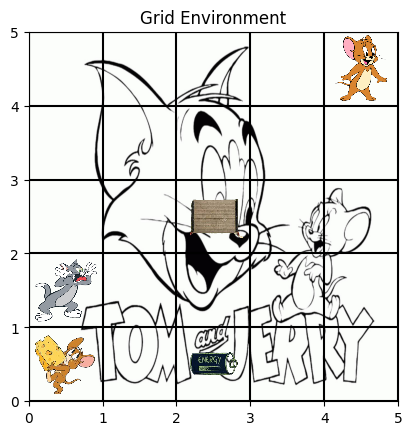

In [49]:
# Example usage
env = StochasticGridEnvironment()
state = env.reset()
env.render()


Current_state: 9 ,Action: 2 , Reward: 0 , Done: False


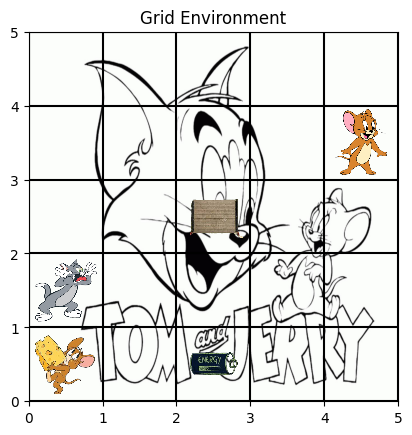

Current_state: 9 ,Action: 0 , Reward: 0 , Done: False


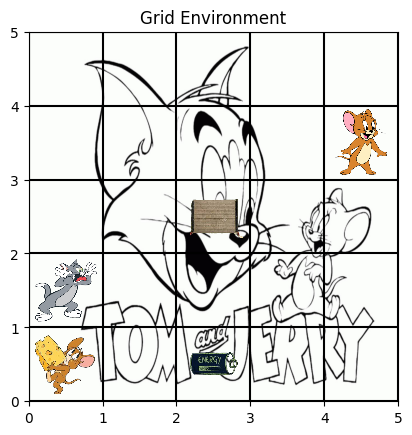

Current_state: 8 ,Action: 3 , Reward: 0 , Done: False


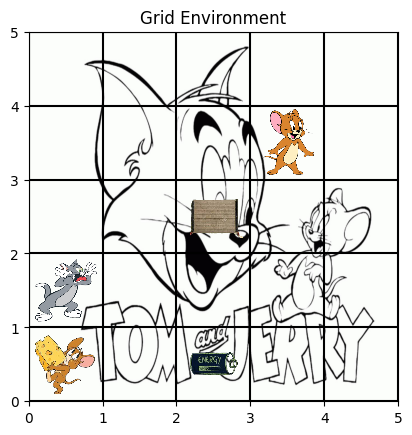

Current_state: 7 ,Action: 2 , Reward: 0 , Done: False


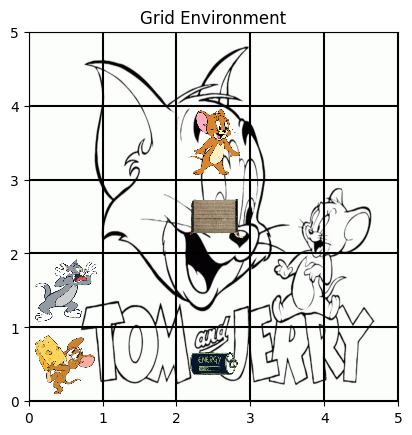

Current_state: 6 ,Action: 3 , Reward: 0 , Done: False


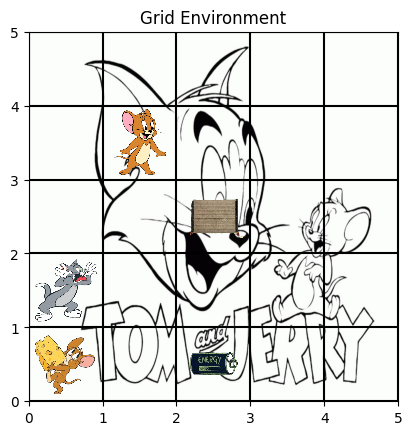

Current_state: 7 ,Action: 2 , Reward: 0 , Done: False


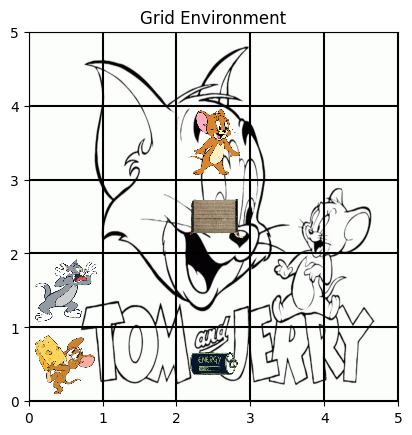

Current_state: 6 ,Action: 1 , Reward: 0 , Done: False


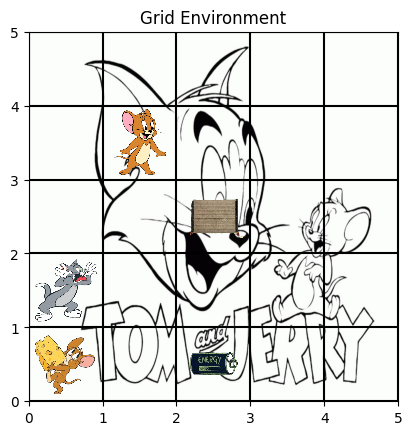

Current_state: 7 ,Action: 3 , Reward: 0 , Done: False


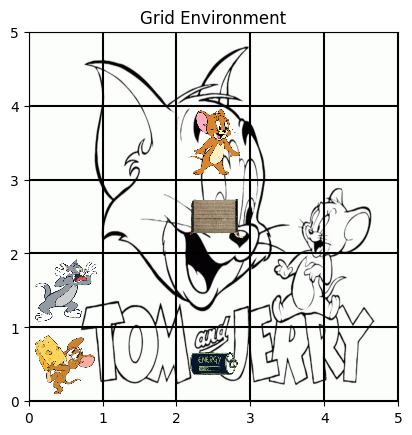

Current_state: 6 ,Action: 1 , Reward: 0 , Done: False


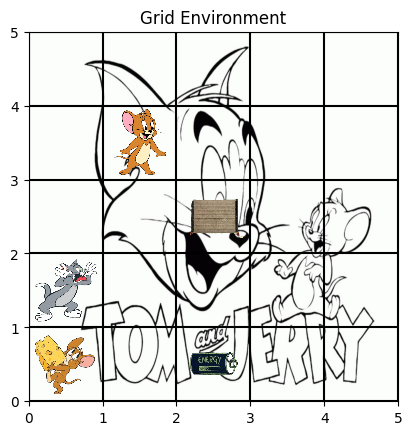

Current_state: 5 ,Action: 1 , Reward: 0 , Done: False


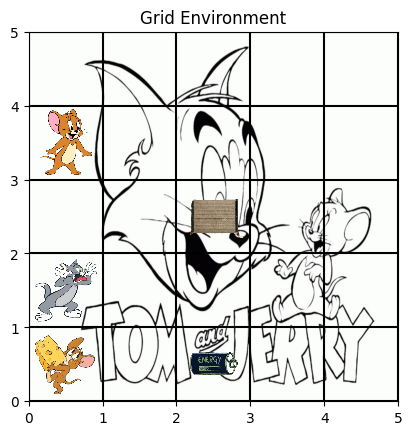

Current_state: 5 ,Action: 0 , Reward: 0 , Done: False


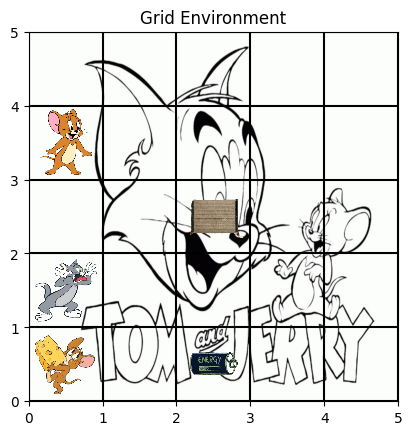

Current_state: 10 ,Action: 1 , Reward: 0 , Done: False


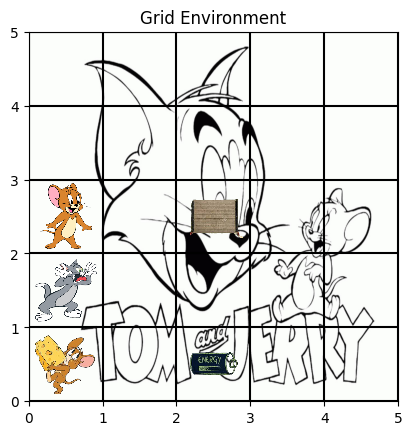

Current_state: 5 ,Action: 1 , Reward: 0 , Done: False


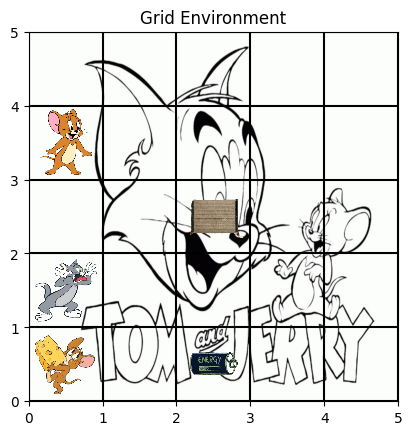

Current_state: 10 ,Action: 1 , Reward: 0 , Done: False


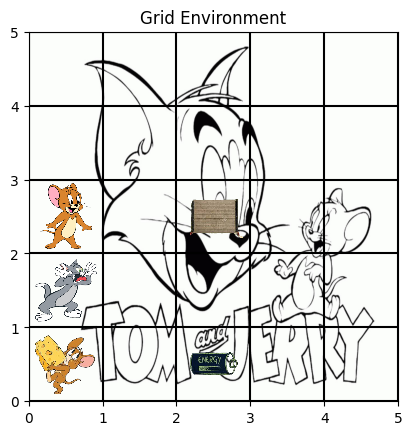

Current_state: 15 ,Action: 0 , Reward: -4 , Done: False


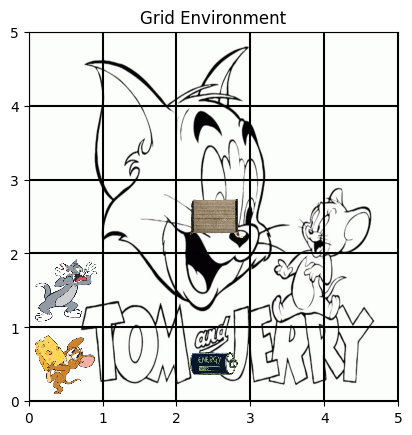

Current_state: 10 ,Action: 3 , Reward: 0 , Done: False


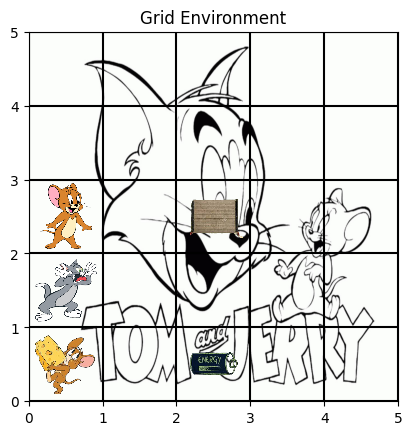

Current_state: 15 ,Action: 0 , Reward: -4 , Done: False


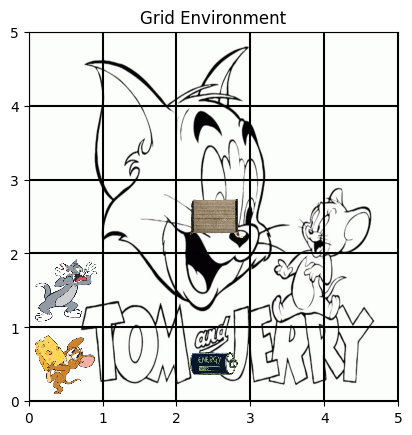

Current_state: 16 ,Action: 2 , Reward: 0 , Done: False


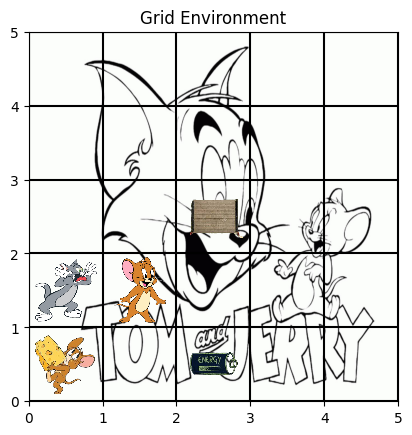

Current_state: 11 ,Action: 2 , Reward: 0 , Done: False


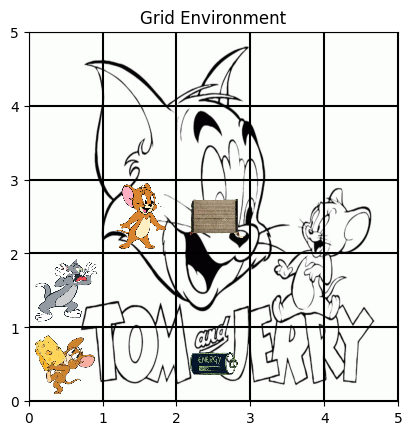

Current_state: 6 ,Action: 0 , Reward: 0 , Done: False


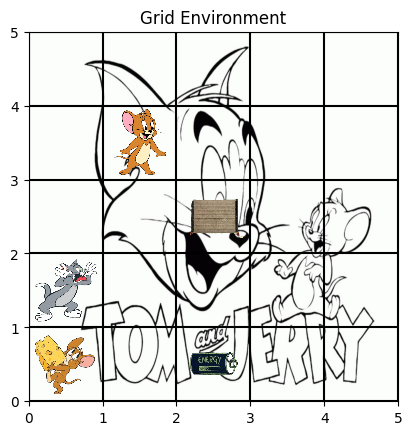

Current_state: 11 ,Action: 3 , Reward: 0 , Done: False


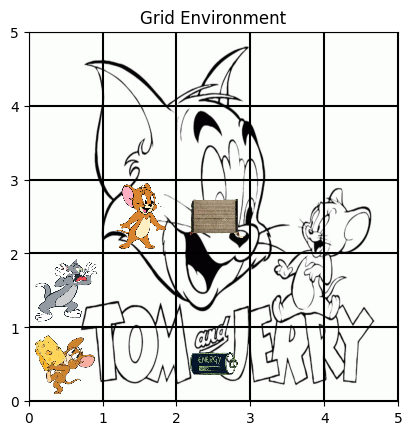

Current_state: 6 ,Action: 3 , Reward: 0 , Done: False


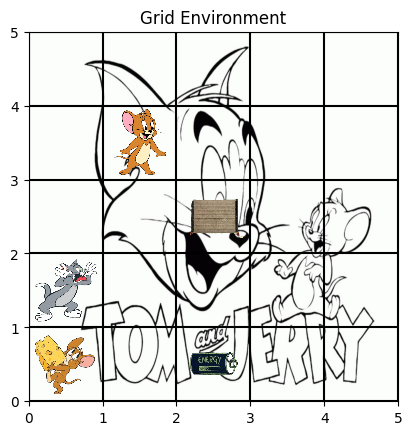

Current_state: 5 ,Action: 1 , Reward: 0 , Done: False


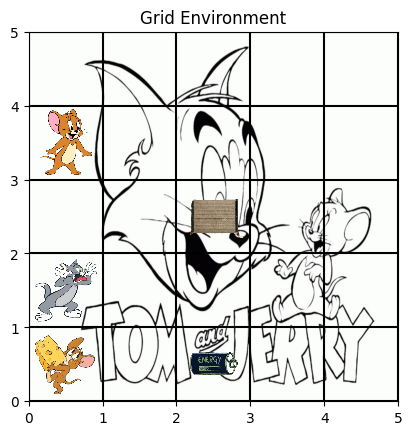

Current_state: 6 ,Action: 1 , Reward: 0 , Done: False


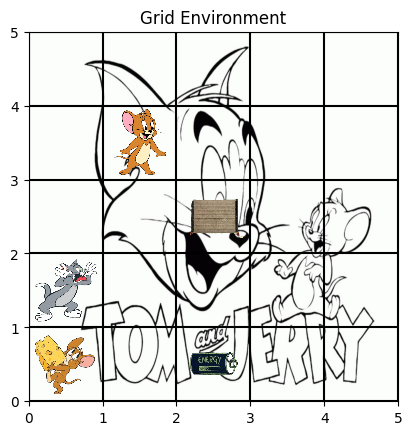

Current_state: 11 ,Action: 3 , Reward: 0 , Done: False


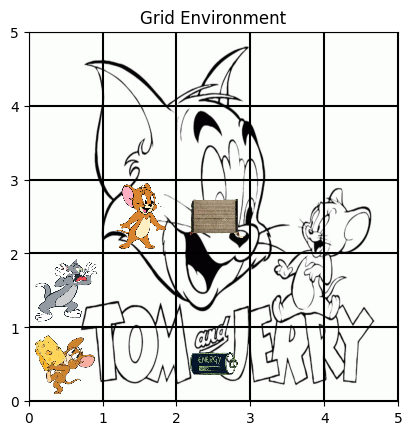

Current_state: 6 ,Action: 3 , Reward: 0 , Done: False


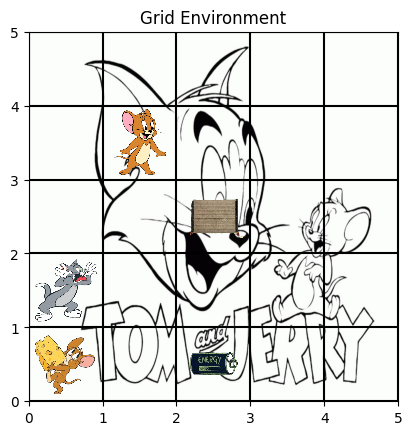

Current_state: 5 ,Action: 3 , Reward: 0 , Done: False


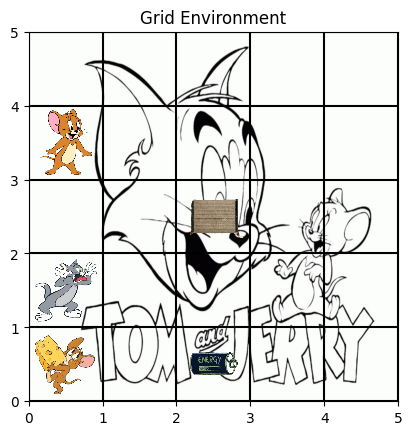

Current_state: 5 ,Action: 0 , Reward: 0 , Done: False


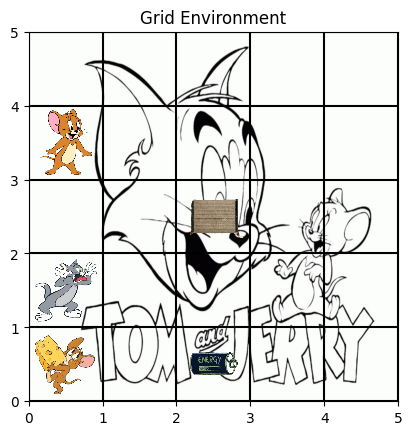

Current_state: 6 ,Action: 2 , Reward: 0 , Done: False


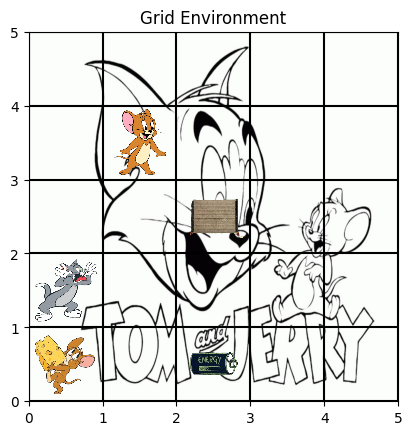

Current_state: 7 ,Action: 2 , Reward: 0 , Done: True


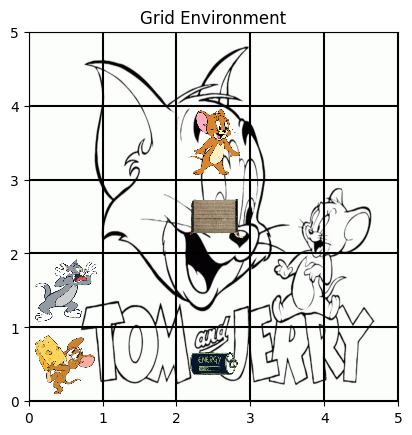

Agent ran out of time


In [50]:
if __name__ == '__main__':
  env = StochasticGridEnvironment()
  agent = RandomAgent_d(env)

  state= env.reset()
  done = False


  while not done:
    action = agent.step(state)
    next_state, reward, done, info = env.step(action)
    print('Current_state:',next_state,',Action:', action, ', Reward:', reward, ', Done:', done)
    env.render()
    if done == True and env.timestep < max_timesteps:
      print('Agent has reached the Goal position')
    elif done == True and env.timestep == max_timesteps:
      print('Agent ran out of time')


**PART - 2**


**2.1**

**Q-learning**





In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [51]:
class QLearningAgent:
    def __init__(self, env, alpha=0.01, gamma=0.8, epsilon=1.0, epsilon_min=0.01, num_of_episodes=400):
        self.env = env
        self.alpha = alpha  # Learning rate
        self.gamma = gamma  # Discount factor
        self.epsilon = epsilon  # Exploration rate
        self.epsilon_min = epsilon_min
        self.num_of_episodes = num_of_episodes
        self.q_table = np.zeros((self.env.observation_space.n, self.env.action_space.n))
        self.epsilon_history = []

    def choose_action(self, state):
        q_state = self.q_table[state]
        random_action = np.random.choice(self.env.action_space.n)
        greedy_action = np.argmax(q_state)
        which_action_is_taken = " "

        if np.random.rand() < self.epsilon:
            which_action_is_taken ="random"
            #print(random_action, which_action_is_taken)
            return random_action, which_action_is_taken
        else:
            which_action_is_taken ="greedy"
            #print(random_action, which_action_is_taken)
            return greedy_action, which_action_is_taken

    def update_q_table(self, state, action, reward, next_state):
        target = reward + self.gamma * np.max(self.q_table[next_state])
        q_value = target - self.q_table[state, action]
        self.q_table[state, action] += self.alpha * q_value


    def decay_epsilon(self):
        decay_factor = (self.epsilon_min / self.epsilon) ** (self.epsilon / self.num_of_episodes)
        self.epsilon *= decay_factor
        self.epsilon_history.append(self.epsilon)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Streaming output truncated to the last 5000 lines.
Episode: 195 , Step-count: 11 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 195 , Step-count: 12 , Action taken: greedy , Reward for this step: 3
greedy
Episode: 195 , Step-count: 13 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 195 , Step-count: 14 , Action taken: random , Reward for this step: 0
random
Episode: 195 , Step-count: 15 , Action taken: random , Reward for this step: 0
random
Episode: 195 , Step-count: 16 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 195 , Step-count: 17 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 195 , Step-count: 18 , Action taken: random , Reward for this step: 20
random
how many times an random action or greedy action is taken- random 7 greedy 12
Reward for each episode-------- 23
Episode count 197
Episode: 196 , Step-count: 0 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 196 , Step-count: 1 , Action taken:

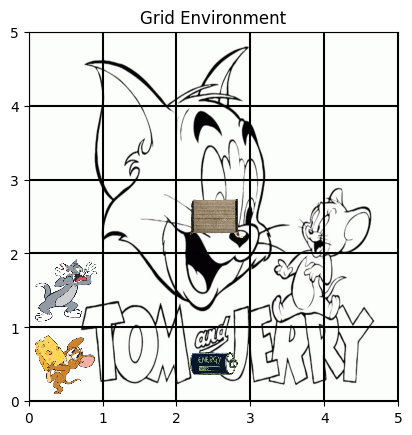

Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 7.67045633e-12  0.00000000e+00  1.19764813e-14  1.22113665e-13]
 [ 1.49706016e-12  0.00000000e+00  3.32761953e-09  6.13636506e-14]
 [ 6.80595510e-08  0.00000000e+00  4.03474565e-05  5.34934900e-12]
 [ 4.02944126e-02  2.23301856e-04  4.57748389e-04  3.32761953e-09]
 [ 2.16288558e-01  5.85646208e-03  6.25379777e-03  2.35917766e-03]
 [ 1.81028408e-06  0.00000000e+00  1.36854266e-07  6.32342004e-10]
 [ 1.10124825e-03  1.51833674e-13  1.54012008e-09  5.43675369e-09]
 [-5.32254343e-02  3.77687214e-11  9.92027119e-03  2.46575733e-06]
 [ 6.44410734e-01  4.30956639e-04  9.56747909e-04  1.

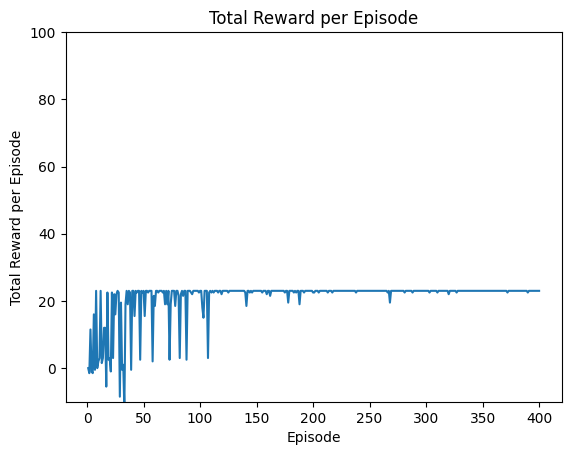

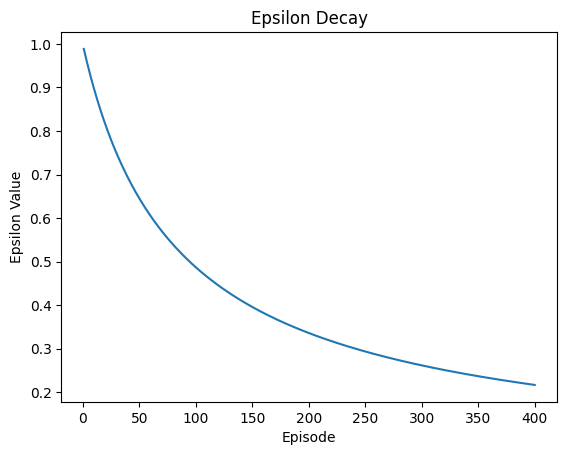

Number of times agent reached the goal state--- 371
Number of times agent ran out of time---- 29
Number of times agent is taking random action [30, 30, 13, 29, 30, 17, 29, 28, 28, 28, 25, 23, 25, 25, 19, 25, 25, 11, 24, 25, 27, 4, 24, 14, 15, 16, 13, 14, 21, 14, 23, 22, 22, 5, 12, 11, 21, 18, 25, 18, 14, 15, 10, 17, 8, 15, 20, 6, 7, 17, 9, 9, 11, 19, 15, 6, 10, 23, 20, 14, 10, 6, 15, 9, 4, 2, 10, 7, 16, 12, 11, 10, 18, 8, 12, 8, 7, 9, 7, 8, 11, 23, 7, 5, 10, 7, 17, 17, 12, 8, 11, 6, 9, 2, 4, 6, 4, 5, 3, 18, 5, 16, 7, 11, 7, 8, 17, 3, 3, 6, 9, 10, 3, 6, 11, 1, 9, 0, 8, 7, 2, 10, 5, 3, 4, 3, 2, 2, 5, 4, 3, 5, 4, 6, 2, 6, 4, 4, 8, 5, 11, 5, 3, 5, 5, 3, 8, 2, 5, 14, 3, 1, 4, 11, 17, 3, 4, 6, 6, 5, 3, 16, 5, 4, 0, 7, 3, 8, 4, 6, 2, 0, 4, 4, 2, 1, 2, 3, 3, 5, 5, 3, 3, 11, 9, 5, 4, 11, 2, 4, 12, 8, 5, 5, 2, 7, 4, 3, 1, 1, 5, 4, 5, 5, 5, 5, 4, 3, 3, 1, 1, 0, 4, 4, 4, 5, 6, 4, 2, 2, 4, 3, 4, 6, 12, 5, 4, 0, 3, 2, 2, 2, 3, 5, 3, 2, 0, 6, 2, 6, 2, 7, 6, 0, 3, 2, 8, 2, 3, 1, 5, 3, 1, 0, 2, 3, 7, 1

'\n# Training loop\nrewards_per_epi = []\nn_reached_gstate = 0\nn_ran_out_time = 0\nn_random_action_for_each_episode = []\nn_greedy_actionfor_each_episode = []\n\nfor episode in range(num_episodes):\n    state = env.reset()\n    done = False\n    total_reward = 0\n\n    for steps in range(max_timesteps):\n        action = agent.choose_action(state)\n        next_state, reward, done, info = env.step(action)\n        agent.update_q_table(state, action, reward, next_state)\n        total_reward += reward\n        state = next_state\n\n        if done:\n            break\n\n    rewards_per_epi.append(total_reward)\n    agent.decay_epsilon(episode + 1)  # Pass episode + 1 to decay_epsilon\n\n    if done and env.timestep < max_timesteps:\n        n_reached_gstate += 1\n    elif done and env.timestep == max_timesteps:\n        n_ran_out_time += 1\n\n# Save trained Q-table\nwith open("/content/drive/MyDrive/RL_models/q_table_deterministic_model.pickle", "wb") as f:\n    pickle.dump(agent.q_tab

In [53]:



num_episodes = 400
# Initialize environment and agent
env = GridEnvironmentwith_cat_cheese()
agent = QLearningAgent(env=GridEnvironmentwith_cat_cheese(),num_of_episodes = num_episodes)
q_tables = []
rewards_per_epi_ql_deter = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)

        action,action_taken = agent.choose_action(state)
        if action_taken =="random":
          random_count = random_count+1
        else:
          greedy_count = greedy_count+1

        next_state, reward, done, info = env.step(action)

        #next_state = 0  # for simplicity, assume next state is always 0
        #print(state,action,reward,next_state)

        agent.update_q_table(state, action, reward, next_state)
        total_reward += reward
        state = next_state
        #env.render()


        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi_ql_deter.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1

env.render()

# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/q_table_deterministic_model.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)

print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
q_table_deterministic_model = agent.q_table
# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi_ql_deter)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-10,100)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
print("Number of times agent is taking random action",n_random_action_for_each_episode)
print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)

"""
# Training loop
rewards_per_epi = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode = []
n_greedy_actionfor_each_episode = []

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0

    for steps in range(max_timesteps):
        action = agent.choose_action(state)
        next_state, reward, done, info = env.step(action)
        agent.update_q_table(state, action, reward, next_state)
        total_reward += reward
        state = next_state

        if done:
            break

    rewards_per_epi.append(total_reward)
    agent.decay_epsilon(episode + 1)  # Pass episode + 1 to decay_epsilon

    if done and env.timestep < max_timesteps:
        n_reached_gstate += 1
    elif done and env.timestep == max_timesteps:
        n_ran_out_time += 1

# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/q_table_deterministic_model.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)

# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-10, 100)
plt.title("Total Reward per Episode")
plt.show()

plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---", n_reached_gstate)
print("Number of times agent ran out of time----", n_ran_out_time)
"""

Here in q table 21st row is the goal position

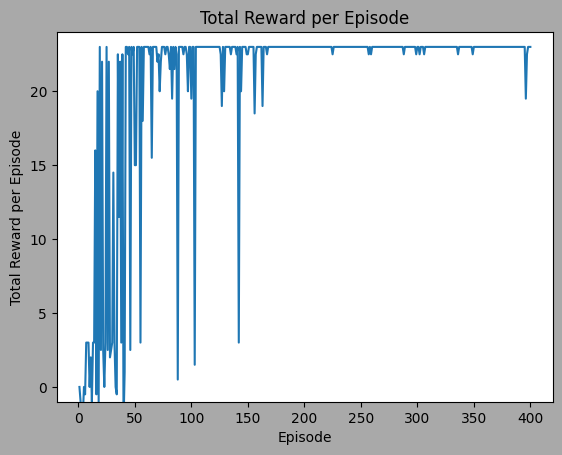

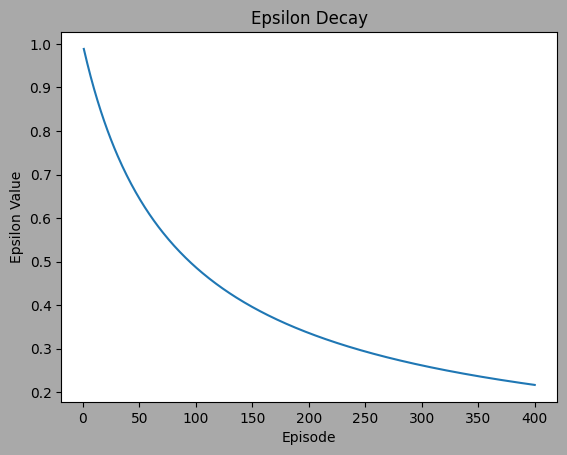

In [243]:
plt.plot(range(1, num_episodes + 1), rewards_per_epi_ql_deter)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-1,24)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

Testing with only greedy actions

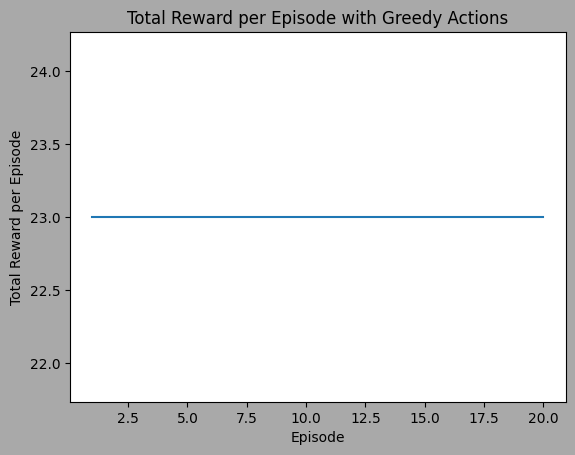

In [363]:
def testing(env,Q_table,eps=20):

  rewards_per_episode_greedy = []

  for episode in range(eps):
      state = env.reset()
      done = False
      total_reward = 0

      while not done:
          q_state = Q_table[state]
          greedy_action = np.argmax(q_state)
          next_state, reward, done, _ = env.step(greedy_action)
          total_reward += reward
          state = next_state


      rewards_per_episode_greedy.append(total_reward)

  plt.plot(range(1, eps + 1), rewards_per_episode_greedy)
  plt.xlabel("Episode")
  plt.ylabel("Total Reward per Episode")
  plt.title("Total Reward per Episode with Greedy Actions")
  plt.show()
testing( GridEnvironmentwith_cat_cheese(),q_table_deterministic_model)

In [245]:
!pip install optuna

In [246]:
import optuna


def hyperparameter_tuning(trial):

    alpha = trial.suggest_float('alpha', 0.0001, 0.1)
    gamma = trial.suggest_float('gamma', 0.1,0.99)
    epsilon_min = trial.suggest_float('epsilon_min', 0.001, 0.01)


    agent = QLearningAgent(env=GridEnvironmentwith_cat_cheese(),  gamma=gamma,epsilon_min=epsilon_min)


    num_episodes = 400

    for episode in range(num_episodes):
        state = env.reset()
        done = False
        total_reward = 0

        for steps in range(max_timesteps):
            action, _ = agent.choose_action(state)
            next_state, reward, done, _ = env.step(action)
            agent.update_q_table(state, action, reward, next_state)
            total_reward += reward
            state = next_state

            if done:
                break
    return total_reward


grid = optuna.create_study(direction='maximize')
grid.optimize(hyperparameter_tuning, n_trials=100)


top_3_hyperparams = [trial.params for trial in grid.trials[:3]]

print("Top 3 sets of hyperparameters:")
for i, params in enumerate(top_3_hyperparams, 1):
    print(f"Top {i}: {params}")


[I 2024-02-22 18:57:28,110] A new study created in memory with name: no-name-6aba1357-aee7-4969-b66c-d22e458172e0
[I 2024-02-22 18:57:29,749] Trial 0 finished with value: -4.0 and parameters: {'alpha': 0.05139523464194336, 'gamma': 0.5055730585288767, 'epsilon_min': 0.006141632473028161}. Best is trial 0 with value: -4.0.
[I 2024-02-22 18:57:31,570] Trial 1 finished with value: 2.5 and parameters: {'alpha': 0.06722753695713164, 'gamma': 0.3403231006180922, 'epsilon_min': 0.00941544308522815}. Best is trial 1 with value: 2.5.
[I 2024-02-22 18:57:33,271] Trial 2 finished with value: -0.5 and parameters: {'alpha': 0.09021773523238219, 'gamma': 0.14535102099447467, 'epsilon_min': 0.004738159577509665}. Best is trial 1 with value: 2.5.
[I 2024-02-22 18:57:35,482] Trial 3 finished with value: -8.0 and parameters: {'alpha': 0.07464112670861832, 'gamma': 0.9455258978478813, 'epsilon_min': 0.002135680153700989}. Best is trial 1 with value: 2.5.
[I 2024-02-22 18:57:38,645] Trial 4 finished with 

Top 3 sets of hyperparameters:
Top 1: {'alpha': 0.05139523464194336, 'gamma': 0.5055730585288767, 'epsilon_min': 0.006141632473028161}
Top 2: {'alpha': 0.06722753695713164, 'gamma': 0.3403231006180922, 'epsilon_min': 0.00941544308522815}
Top 3: {'alpha': 0.09021773523238219, 'gamma': 0.14535102099447467, 'epsilon_min': 0.004738159577509665}


In [247]:
for i, params in enumerate(top_3_hyperparams, 1):
  print(params)

{'alpha': 0.05139523464194336, 'gamma': 0.5055730585288767, 'epsilon_min': 0.006141632473028161}
{'alpha': 0.06722753695713164, 'gamma': 0.3403231006180922, 'epsilon_min': 0.00941544308522815}
{'alpha': 0.09021773523238219, 'gamma': 0.14535102099447467, 'epsilon_min': 0.004738159577509665}


In [248]:
ls_gamma=[]
ls_eps_min=[]
ls_alpha=[]
for i, params in enumerate(top_3_hyperparams, 1):
  for key,value in params.items():
    if key=="gamma":
      ls_gamma.append(value)
    elif key=="epsilon_min":
      ls_eps_min.append(value)
    else:
      ls_alpha.append(value)


Hyperparameter - model 1
with first best gamma value

Streaming output truncated to the last 5000 lines.
random
Episode: 197 , Step-count: 4 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 197 , Step-count: 5 , Action taken: greedy , Reward for this step: 3
greedy
Episode: 197 , Step-count: 6 , Action taken: random , Reward for this step: 0
random
Episode: 197 , Step-count: 7 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 197 , Step-count: 8 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 197 , Step-count: 9 , Action taken: greedy , Reward for this step: 20
greedy
how many times an random action or greedy action is taken- random 2 greedy 8
Reward for each episode-------- 23
Episode count 199
Episode: 198 , Step-count: 0 , Action taken: random , Reward for this step: 0
random
Episode: 198 , Step-count: 1 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 198 , Step-count: 2 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 198 , Step-count: 3 , Action taken: r

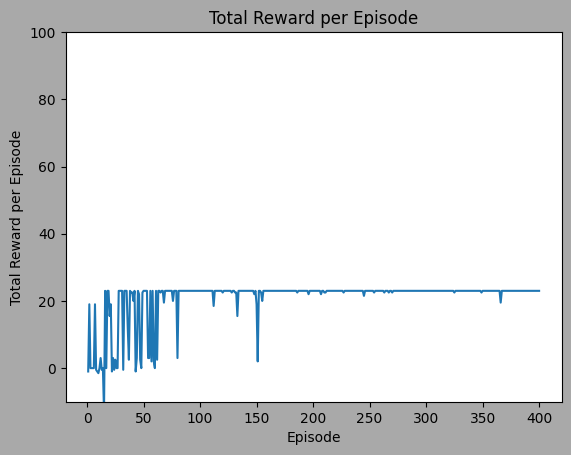

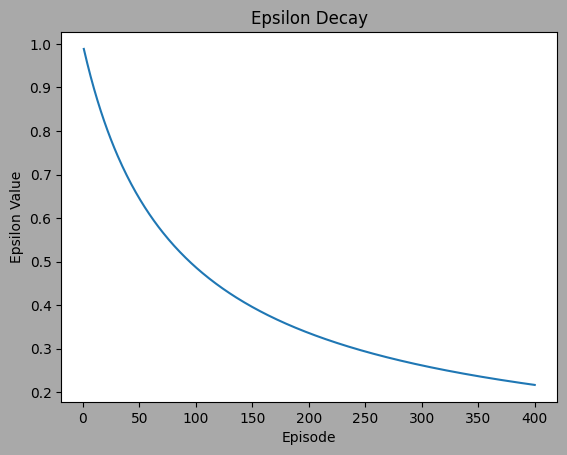

Number of times agent reached the goal state--- 364
Number of times agent ran out of time---- 36
Number of times agent is taking random action [30, 27, 29, 29, 28, 30, 18, 27, 28, 27, 29, 27, 26, 26, 27, 17, 25, 10, 14, 14, 7, 22, 27, 24, 25, 22, 25, 17, 19, 12, 21, 18, 14, 13, 20, 10, 22, 15, 19, 21, 21, 4, 17, 22, 5, 14, 21, 24, 15, 8, 4, 9, 9, 20, 20, 9, 21, 3, 20, 19, 9, 21, 5, 18, 11, 4, 5, 7, 14, 13, 2, 5, 7, 5, 10, 8, 8, 5, 7, 19, 6, 13, 5, 12, 7, 5, 13, 8, 1, 9, 6, 10, 3, 12, 7, 10, 7, 2, 5, 8, 2, 6, 10, 3, 2, 8, 4, 2, 10, 8, 5, 8, 3, 8, 6, 2, 11, 9, 4, 6, 4, 10, 1, 7, 11, 4, 3, 3, 4, 8, 9, 9, 8, 2, 3, 2, 8, 1, 6, 3, 2, 4, 3, 7, 7, 8, 5, 10, 5, 6, 16, 5, 6, 7, 3, 0, 7, 4, 11, 3, 5, 3, 5, 4, 1, 4, 3, 10, 12, 5, 3, 1, 10, 3, 5, 4, 3, 1, 7, 7, 7, 8, 3, 5, 4, 9, 5, 5, 3, 2, 4, 5, 7, 12, 3, 6, 3, 2, 3, 6, 2, 8, 2, 4, 1, 4, 5, 5, 3, 4, 4, 3, 3, 1, 9, 2, 2, 8, 5, 1, 2, 2, 1, 3, 4, 7, 6, 3, 2, 4, 2, 1, 2, 3, 0, 0, 4, 1, 5, 3, 2, 0, 2, 3, 7, 5, 0, 1, 2, 0, 0, 5, 3, 10, 1, 0, 3, 1, 3, 2,

In [249]:
num_episodes = 400
env = GridEnvironmentwith_cat_cheese()

agent = QLearningAgent(env = GridEnvironmentwith_cat_cheese(),gamma = ls_gamma[0],alpha=0.01,epsilon=1.0, epsilon_min=0.01,num_of_episodes=num_episodes)

# Training loop

rewards_per_epi = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)

        action,action_taken = agent.choose_action(state)
        if action_taken =="random":
          random_count = random_count+1
        else:
          greedy_count = greedy_count+1

        next_state, reward, done, info = env.step(action)

        #next_state = 0  # for simplicity, assume next state is always 0
        #print(state,action,reward,next_state)

        agent.update_q_table(state, action, reward, next_state)
        total_reward += reward
        state = next_state
        #env.render()


        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1



# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/q_table_deterministic_model1_hyperparam.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)


print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
q_table_deterministic_model1_hyperparam = agent.q_table

# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-10,100)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
print("Number of times agent is taking random action",n_random_action_for_each_episode)
print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)


This model is performing better because it is using the greedy actions and here after few epsiodes we are using the optimized policy where the agent is taking all the greedy actions so as to increase the cumlative reward which is what here we are getting reward 23( which is max cumlative reward in this environment) after 200 episodes

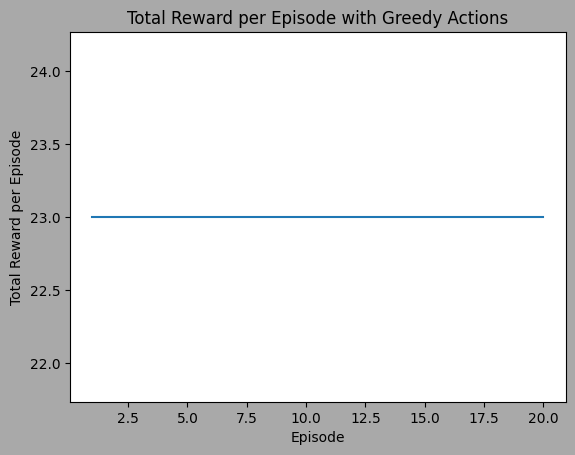

In [250]:
testing(GridEnvironmentwith_cat_cheese(),q_table_deterministic_model1_hyperparam,eps=20)

Hyperparameter - model 2
with second best gamma

Streaming output truncated to the last 5000 lines.
greedy
Episode: 207 , Step-count: 7 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 207 , Step-count: 8 , Action taken: random , Reward for this step: 0
random
Episode: 207 , Step-count: 9 , Action taken: random , Reward for this step: 3
random
Episode: 207 , Step-count: 10 , Action taken: random , Reward for this step: 0
random
Episode: 207 , Step-count: 11 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 207 , Step-count: 12 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 207 , Step-count: 13 , Action taken: random , Reward for this step: 0
random
Episode: 207 , Step-count: 14 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 207 , Step-count: 15 , Action taken: random , Reward for this step: 20
random
how many times an random action or greedy action is taken- random 8 greedy 8
Reward for each episode-------- 23
Episode count 209
Episode: 208 , Step-count: 0 , Action ta

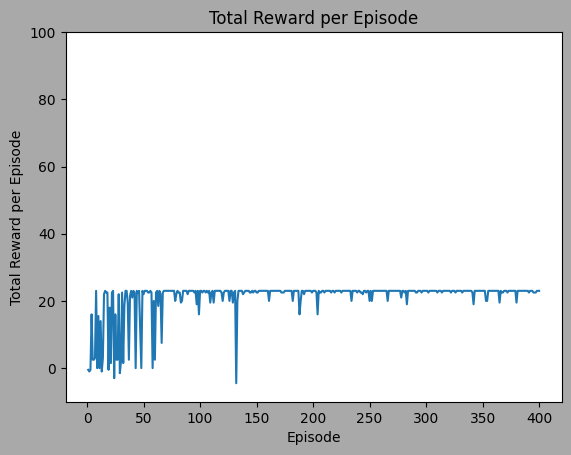

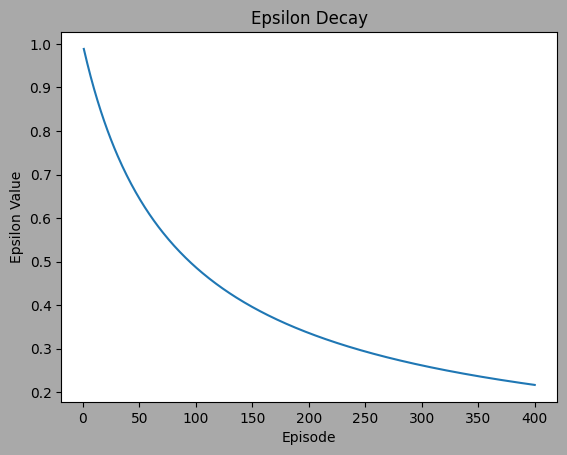

Number of times agent reached the goal state--- 374
Number of times agent ran out of time---- 26
Number of times agent is taking random action [30, 30, 29, 13, 29, 28, 26, 27, 29, 23, 26, 19, 27, 25, 25, 20, 20, 15, 26, 16, 23, 9, 21, 24, 9, 22, 24, 13, 23, 22, 6, 22, 15, 13, 14, 19, 19, 22, 22, 23, 13, 14, 24, 11, 20, 8, 6, 25, 17, 16, 6, 9, 20, 8, 5, 4, 13, 20, 6, 22, 13, 15, 13, 13, 9, 17, 10, 5, 15, 4, 5, 4, 6, 9, 6, 10, 4, 5, 11, 6, 4, 14, 12, 17, 6, 3, 9, 4, 12, 2, 9, 16, 7, 10, 4, 6, 10, 9, 5, 7, 3, 5, 2, 3, 7, 4, 12, 5, 5, 11, 3, 3, 4, 4, 8, 4, 3, 3, 7, 5, 6, 5, 3, 9, 3, 7, 7, 7, 5, 12, 4, 16, 5, 8, 4, 7, 8, 4, 6, 11, 3, 6, 9, 4, 2, 7, 1, 8, 6, 5, 8, 1, 4, 5, 5, 1, 10, 7, 2, 7, 13, 2, 3, 6, 4, 11, 4, 8, 3, 2, 3, 6, 3, 2, 5, 2, 4, 2, 3, 5, 2, 12, 5, 2, 6, 1, 1, 2, 3, 2, 5, 5, 10, 0, 2, 2, 1, 3, 8, 1, 0, 8, 2, 13, 1, 5, 6, 8, 3, 4, 3, 3, 2, 3, 2, 6, 3, 1, 9, 6, 5, 3, 2, 8, 7, 3, 1, 1, 4, 0, 1, 1, 1, 5, 1, 0, 11, 3, 5, 2, 0, 4, 6, 5, 5, 0, 3, 5, 5, 9, 3, 1, 2, 8, 1, 3, 6, 4, 2, 3,

In [251]:

num_episodes = 400
env = GridEnvironmentwith_cat_cheese()
agent = QLearningAgent(env = GridEnvironmentwith_cat_cheese(),gamma = ls_gamma[1],alpha=0.01,epsilon=1.0, epsilon_min=0.01,num_of_episodes=num_episodes)

rewards_per_epi = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)

        action,action_taken = agent.choose_action(state)
        if action_taken =="random":
          random_count = random_count+1
        else:
          greedy_count = greedy_count+1

        next_state, reward, done, info = env.step(action)

        #next_state = 0  # for simplicity, assume next state is always 0
        #print(state,action,reward,next_state)

        agent.update_q_table(state, action, reward, next_state)
        total_reward += reward
        state = next_state
        #env.render()


        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1



# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/q_table_deterministic_model2_hyperparam.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)


print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
_table_deterministic_model2_hyperparam = agent.q_table

# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-10,100)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
print("Number of times agent is taking random action",n_random_action_for_each_episode)
print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)



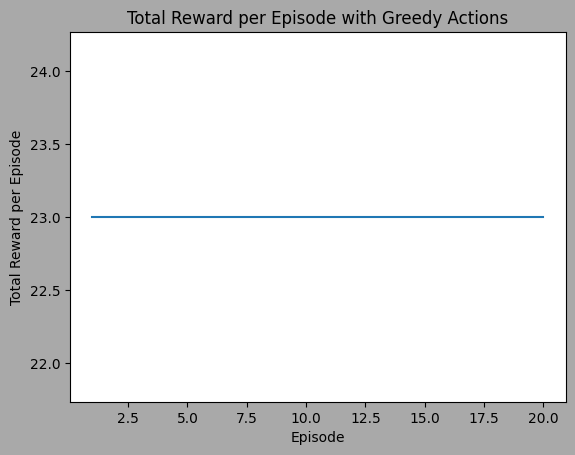

In [252]:
testing( GridEnvironmentwith_cat_cheese(),_table_deterministic_model2_hyperparam,eps = 20)


Hyperparameter - model 3
with 3rd best gamma

Streaming output truncated to the last 5000 lines.
Episode: 200 , Step-count: 0 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 200 , Step-count: 1 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 200 , Step-count: 2 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 200 , Step-count: 3 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 200 , Step-count: 4 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 200 , Step-count: 5 , Action taken: greedy , Reward for this step: 3
greedy
Episode: 200 , Step-count: 6 , Action taken: random , Reward for this step: 0
random
Episode: 200 , Step-count: 7 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 200 , Step-count: 8 , Action taken: random , Reward for this step: 0
random
Episode: 200 , Step-count: 9 , Action taken: random , Reward for this step: 0
random
Episode: 200 , Step-count: 10 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 200 

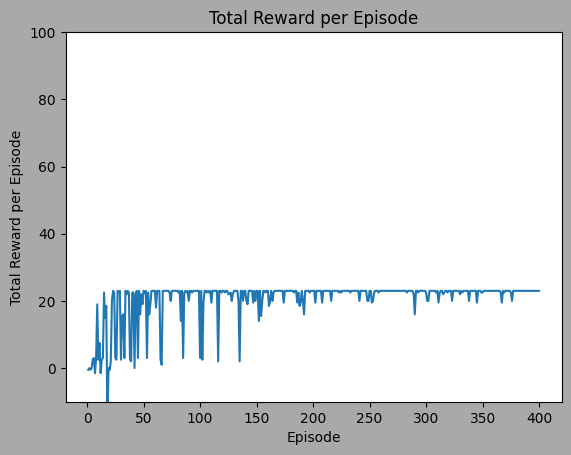

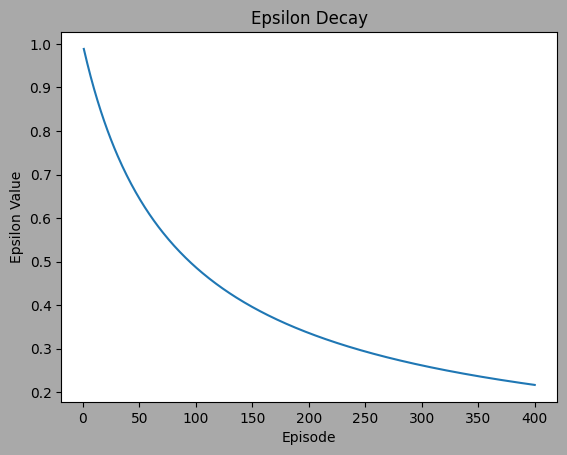

Number of times agent reached the goal state--- 365
Number of times agent ran out of time---- 35
Number of times agent is taking random action [30, 30, 30, 30, 27, 27, 28, 27, 19, 29, 22, 27, 24, 26, 15, 17, 13, 25, 24, 26, 24, 18, 9, 21, 24, 27, 7, 5, 11, 24, 20, 19, 21, 15, 14, 4, 13, 23, 21, 22, 11, 25, 12, 12, 22, 6, 4, 19, 13, 5, 8, 11, 19, 15, 10, 14, 11, 11, 7, 15, 15, 20, 7, 8, 23, 23, 7, 6, 1, 8, 20, 7, 5, 5, 2, 2, 6, 14, 8, 4, 6, 11, 14, 6, 20, 9, 2, 5, 13, 5, 10, 3, 7, 3, 2, 11, 14, 4, 9, 19, 6, 17, 9, 2, 7, 9, 14, 7, 1, 9, 10, 10, 8, 3, 13, 21, 8, 1, 9, 3, 1, 15, 7, 9, 8, 3, 11, 4, 10, 2, 3, 5, 8, 5, 21, 2, 6, 5, 1, 6, 7, 10, 2, 1, 1, 6, 10, 9, 3, 4, 9, 12, 1, 11, 6, 7, 5, 9, 3, 5, 12, 5, 0, 2, 3, 11, 6, 5, 2, 4, 7, 4, 0, 11, 2, 7, 7, 2, 10, 9, 6, 6, 3, 3, 2, 7, 3, 8, 4, 3, 4, 4, 8, 8, 0, 2, 4, 4, 7, 3, 3, 6, 8, 3, 3, 7, 1, 7, 3, 2, 2, 1, 3, 4, 5, 7, 1, 1, 1, 3, 2, 5, 4, 0, 7, 3, 2, 4, 2, 1, 3, 1, 3, 1, 2, 4, 5, 3, 3, 5, 1, 3, 2, 6, 2, 3, 2, 2, 3, 2, 2, 4, 3, 3, 1, 3, 1, 4,

In [253]:

num_episodes = 400
env = GridEnvironmentwith_cat_cheese()
agent = QLearningAgent(env = GridEnvironmentwith_cat_cheese(),gamma = ls_gamma[2],alpha=0.01,epsilon=1.0, epsilon_min=0.01,num_of_episodes=num_episodes)

rewards_per_epi = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)

        action,action_taken = agent.choose_action(state)
        if action_taken =="random":
          random_count = random_count+1
        else:
          greedy_count = greedy_count+1

        next_state, reward, done, info = env.step(action)

        #next_state = 0  # for simplicity, assume next state is always 0
        #print(state,action,reward,next_state)

        agent.update_q_table(state, action, reward, next_state)
        total_reward += reward
        state = next_state
        #env.render()


        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1



# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/q_table_deterministic_model3_hyperparam.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)


print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
q_table_deterministic_model3_hyperparam = agent.q_table

# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-10,100)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
print("Number of times agent is taking random action",n_random_action_for_each_episode)
print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)


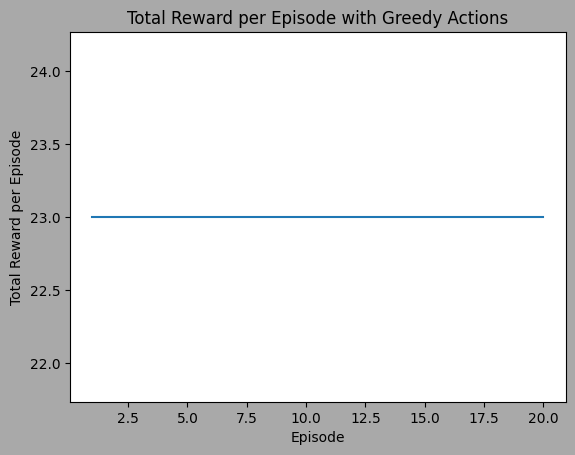

In [254]:
testing( GridEnvironmentwith_cat_cheese(),q_table_deterministic_model3_hyperparam,eps = 20)

Hyperparameter model - 4 with first best epsilon min value



Streaming output truncated to the last 5000 lines.
Episode: 194 , Step-count: 1 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 194 , Step-count: 2 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 194 , Step-count: 3 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 194 , Step-count: 4 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 194 , Step-count: 5 , Action taken: random , Reward for this step: 3
random
Episode: 194 , Step-count: 6 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 194 , Step-count: 7 , Action taken: greedy , Reward for this step: 20
greedy
how many times an random action or greedy action is taken- random 1 greedy 7
Reward for each episode-------- 23
Episode count 196
Episode: 195 , Step-count: 0 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 195 , Step-count: 1 , Action taken: random , Reward for this step: 0
random
Episode: 195 , Step-count: 2 , Action taken: greedy ,

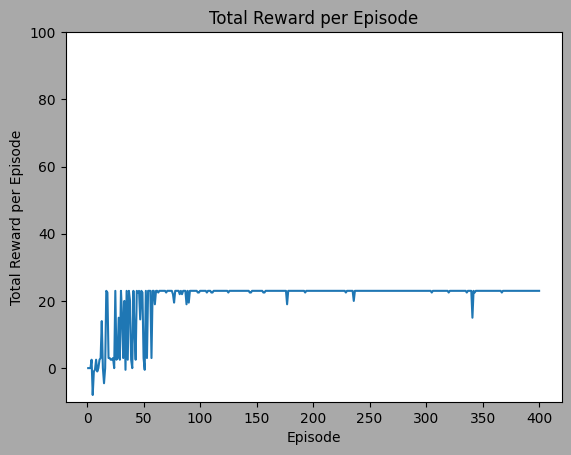

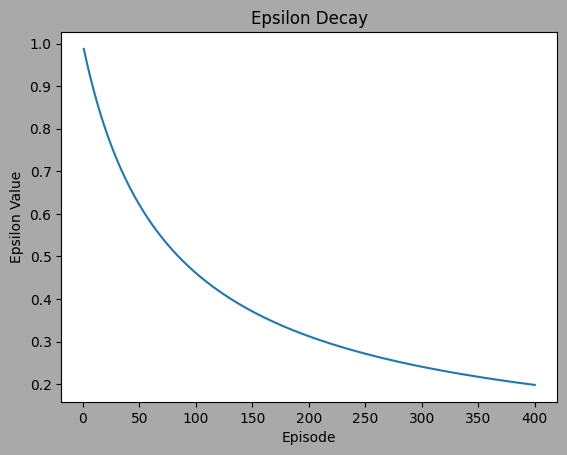

Number of times agent reached the goal state--- 365
Number of times agent ran out of time---- 35
Number of times agent is taking random action [30, 30, 29, 29, 30, 29, 27, 28, 27, 28, 28, 27, 24, 28, 27, 25, 16, 18, 19, 25, 21, 26, 24, 24, 7, 25, 22, 14, 27, 7, 10, 21, 10, 25, 12, 22, 16, 20, 17, 22, 16, 12, 19, 8, 20, 14, 18, 18, 10, 23, 20, 3, 20, 14, 7, 18, 18, 9, 7, 12, 6, 21, 5, 6, 12, 10, 10, 19, 15, 4, 8, 17, 5, 3, 4, 7, 4, 16, 8, 3, 5, 16, 4, 10, 10, 15, 5, 10, 7, 11, 4, 6, 7, 4, 7, 3, 11, 8, 6, 15, 5, 8, 2, 8, 2, 9, 6, 0, 7, 5, 5, 8, 11, 4, 10, 3, 2, 1, 2, 6, 1, 3, 5, 5, 6, 6, 15, 0, 4, 2, 4, 8, 4, 7, 3, 11, 7, 4, 6, 6, 2, 5, 3, 8, 2, 4, 4, 0, 1, 5, 2, 9, 5, 3, 2, 6, 8, 3, 1, 5, 7, 4, 3, 14, 1, 1, 7, 4, 1, 4, 3, 7, 8, 1, 3, 3, 2, 3, 4, 3, 2, 0, 4, 3, 4, 4, 4, 11, 1, 4, 7, 2, 2, 6, 1, 2, 4, 5, 2, 3, 1, 2, 4, 3, 4, 1, 1, 6, 2, 5, 2, 5, 5, 2, 6, 4, 4, 7, 3, 1, 3, 2, 2, 4, 3, 2, 3, 5, 7, 8, 6, 1, 1, 4, 2, 3, 7, 2, 3, 1, 3, 5, 5, 5, 2, 2, 3, 3, 0, 1, 0, 0, 7, 2, 2, 4, 6, 1, 4, 4, 7

In [255]:
num_episodes = 400
env = GridEnvironmentwith_cat_cheese()
agent = QLearningAgent(env = GridEnvironmentwith_cat_cheese(),gamma = 0.8,alpha=0.01,epsilon=1.0, epsilon_min=ls_eps_min[0],num_of_episodes=num_episodes)


rewards_per_epi = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)

        action,action_taken = agent.choose_action(state)
        if action_taken =="random":
          random_count = random_count+1
        else:
          greedy_count = greedy_count+1

        next_state, reward, done, info = env.step(action)

        #next_state = 0  # for simplicity, assume next state is always 0
        #print(state,action,reward,next_state)

        agent.update_q_table(state, action, reward, next_state)
        total_reward += reward
        state = next_state
        #env.render()


        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1



# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/q_table_deterministic_model4_hyperparam.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)


print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
q_table_deterministic_model4_hyperparam = agent.q_table


# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-10,100)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
print("Number of times agent is taking random action",n_random_action_for_each_episode)
print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)


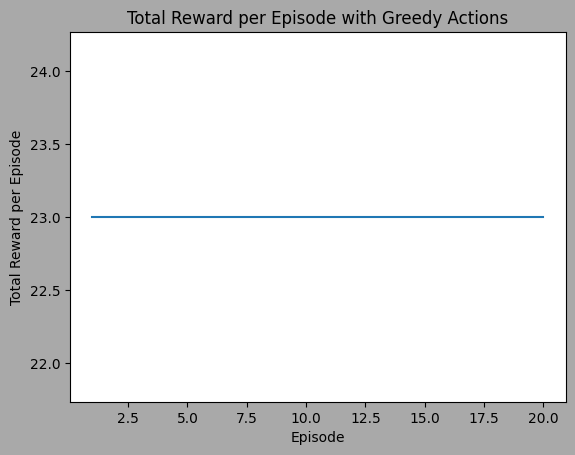

In [256]:
testing( GridEnvironmentwith_cat_cheese(),q_table_deterministic_model4_hyperparam,eps = 20)

Hyperparameter model - 5 with second best epsilon min value



Streaming output truncated to the last 5000 lines.
greedy
Episode: 201 , Step-count: 18 , Action taken: random , Reward for this step: 0
random
Episode: 201 , Step-count: 19 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 201 , Step-count: 20 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 201 , Step-count: 21 , Action taken: greedy , Reward for this step: 20
greedy
how many times an random action or greedy action is taken- random 8 greedy 14
Reward for each episode-------- 22.5
Episode count 203
Episode: 202 , Step-count: 0 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 202 , Step-count: 1 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 202 , Step-count: 2 , Action taken: random , Reward for this step: 0
random
Episode: 202 , Step-count: 3 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 202 , Step-count: 4 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 202 , Step-count: 5 , Action t

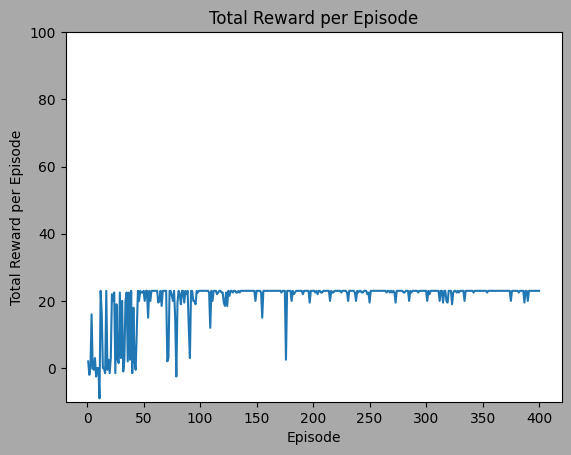

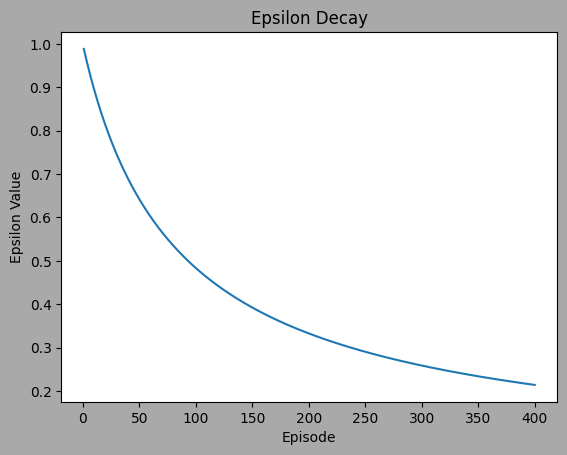

Number of times agent reached the goal state--- 364
Number of times agent ran out of time---- 36
Number of times agent is taking random action [30, 30, 30, 29, 29, 29, 28, 30, 29, 28, 30, 13, 20, 28, 28, 23, 11, 29, 26, 24, 24, 22, 16, 7, 23, 9, 24, 23, 14, 27, 6, 27, 24, 8, 18, 20, 17, 22, 14, 23, 17, 23, 26, 11, 18, 10, 21, 10, 17, 6, 4, 15, 14, 11, 19, 3, 17, 21, 13, 18, 7, 8, 14, 4, 9, 14, 14, 18, 2, 17, 19, 22, 4, 13, 10, 5, 10, 19, 19, 11, 10, 5, 9, 3, 3, 5, 7, 17, 8, 19, 20, 8, 2, 5, 5, 19, 5, 16, 8, 2, 7, 8, 7, 2, 13, 11, 4, 7, 10, 2, 4, 4, 3, 3, 6, 1, 9, 4, 5, 9, 6, 15, 11, 14, 5, 5, 6, 7, 4, 2, 6, 6, 11, 4, 8, 4, 2, 4, 1, 9, 8, 2, 3, 1, 3, 5, 7, 5, 9, 3, 2, 0, 8, 7, 4, 8, 2, 3, 4, 1, 0, 7, 2, 3, 9, 9, 2, 6, 2, 4, 3, 9, 1, 0, 4, 15, 15, 4, 4, 4, 7, 4, 7, 5, 4, 0, 0, 3, 1, 6, 7, 4, 1, 4, 3, 2, 4, 2, 3, 1, 4, 8, 1, 14, 6, 5, 1, 5, 4, 1, 3, 0, 0, 3, 4, 4, 2, 3, 2, 5, 2, 3, 7, 0, 9, 2, 1, 7, 0, 3, 4, 1, 3, 1, 4, 1, 3, 3, 3, 3, 0, 2, 2, 2, 2, 2, 2, 7, 3, 6, 3, 3, 3, 7, 2, 3, 1, 4, 

In [257]:
num_episodes = 400
env = GridEnvironmentwith_cat_cheese()
agent = QLearningAgent(env = GridEnvironmentwith_cat_cheese(),gamma = 0.8,alpha=0.01,epsilon=1.0, epsilon_min=ls_eps_min[1],num_of_episodes=num_episodes)




rewards_per_epi = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)

        action,action_taken = agent.choose_action(state)
        if action_taken =="random":
          random_count = random_count+1
        else:
          greedy_count = greedy_count+1

        next_state, reward, done, info = env.step(action)

        #next_state = 0  # for simplicity, assume next state is always 0
        #print(state,action,reward,next_state)

        agent.update_q_table(state, action, reward, next_state)
        total_reward += reward
        state = next_state
        #env.render()


        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1



# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/q_table_deterministic_model5_hyperparam.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)


print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
q_table_deterministic_model5_hyperparam = agent.q_table



# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-10,100)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
print("Number of times agent is taking random action",n_random_action_for_each_episode)
print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)


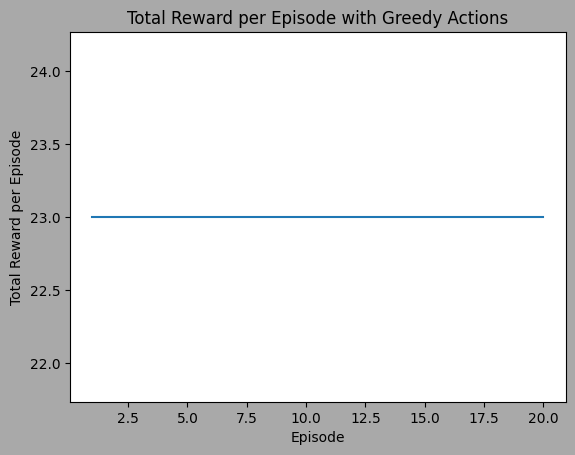

In [258]:
testing( GridEnvironmentwith_cat_cheese(),q_table_deterministic_model5_hyperparam,eps = 20)



Hyperparameter model - 6 with 3rd best epsilon min value


Streaming output truncated to the last 5000 lines.
greedy
Episode: 195 , Step-count: 8 , Action taken: greedy , Reward for this step: 20
greedy
how many times an random action or greedy action is taken- random 2 greedy 7
Reward for each episode-------- 22.5
Episode count 197
Episode: 196 , Step-count: 0 , Action taken: random , Reward for this step: 0
random
Episode: 196 , Step-count: 1 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 196 , Step-count: 2 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 196 , Step-count: 3 , Action taken: random , Reward for this step: 0
random
Episode: 196 , Step-count: 4 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 196 , Step-count: 5 , Action taken: random , Reward for this step: 0
random
Episode: 196 , Step-count: 6 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 196 , Step-count: 7 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 196 , Step-count: 8 , Action taken:

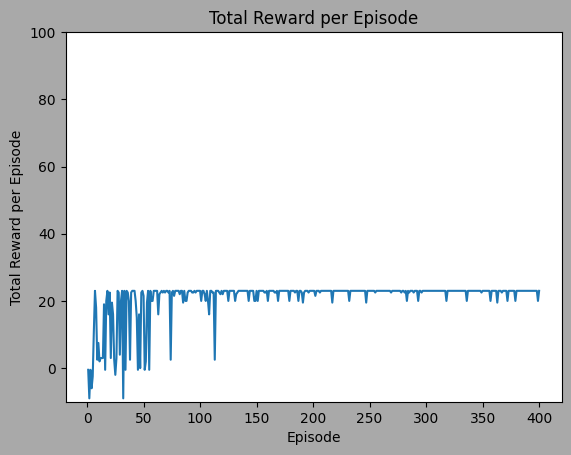

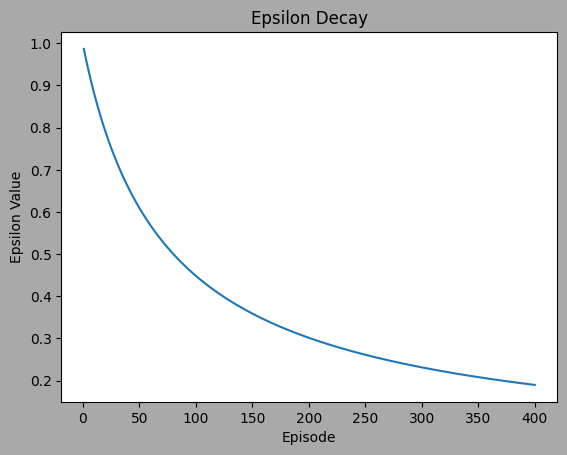

Number of times agent reached the goal state--- 374
Number of times agent ran out of time---- 26
Number of times agent is taking random action [30, 30, 30, 28, 30, 16, 19, 20, 26, 18, 25, 26, 26, 22, 22, 21, 14, 10, 12, 12, 20, 8, 19, 22, 23, 23, 8, 13, 15, 19, 16, 26, 16, 20, 16, 4, 14, 18, 8, 4, 17, 12, 6, 11, 21, 21, 21, 9, 3, 15, 24, 23, 3, 6, 21, 13, 4, 4, 3, 6, 5, 4, 8, 18, 11, 4, 5, 5, 2, 6, 7, 12, 10, 21, 8, 11, 16, 3, 4, 2, 4, 9, 1, 8, 5, 3, 2, 3, 5, 3, 6, 9, 6, 8, 2, 4, 5, 5, 6, 7, 6, 3, 2, 8, 8, 4, 3, 3, 5, 0, 6, 5, 16, 0, 12, 4, 5, 9, 6, 10, 4, 3, 8, 5, 5, 4, 9, 14, 3, 7, 7, 5, 6, 6, 3, 0, 6, 0, 0, 3, 1, 8, 4, 5, 3, 4, 7, 6, 7, 0, 2, 5, 3, 6, 4, 4, 5, 4, 1, 5, 2, 3, 6, 6, 2, 2, 4, 0, 5, 1, 4, 5, 3, 8, 4, 3, 2, 3, 3, 2, 2, 10, 1, 5, 3, 3, 4, 1, 2, 7, 6, 4, 10, 0, 3, 2, 4, 4, 4, 6, 2, 9, 3, 5, 4, 4, 0, 3, 0, 4, 3, 1, 10, 1, 5, 5, 7, 3, 1, 3, 2, 1, 2, 2, 2, 3, 1, 3, 1, 6, 2, 7, 3, 1, 1, 0, 1, 2, 7, 2, 4, 2, 2, 5, 3, 1, 2, 2, 3, 1, 1, 1, 2, 3, 6, 3, 2, 5, 1, 1, 0, 1, 6, 0, 0, 5

In [259]:
num_episodes = 400
env = GridEnvironmentwith_cat_cheese()
agent = QLearningAgent(env = GridEnvironmentwith_cat_cheese(),gamma = 0.8,alpha=0.01,epsilon=1.0, epsilon_min=ls_eps_min[2],num_of_episodes=num_episodes)

rewards_per_epi = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)

        action,action_taken = agent.choose_action(state)
        if action_taken =="random":
          random_count = random_count+1
        else:
          greedy_count = greedy_count+1

        next_state, reward, done, info = env.step(action)

        #next_state = 0  # for simplicity, assume next state is always 0
        #print(state,action,reward,next_state)

        agent.update_q_table(state, action, reward, next_state)
        total_reward += reward
        state = next_state
        #env.render()


        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1



# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/q_table_deterministic_model6_hyperparam.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)


print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
q_table_deterministic_model6_hyperparam = agent.q_table


# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-10,100)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
print("Number of times agent is taking random action",n_random_action_for_each_episode)
print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)


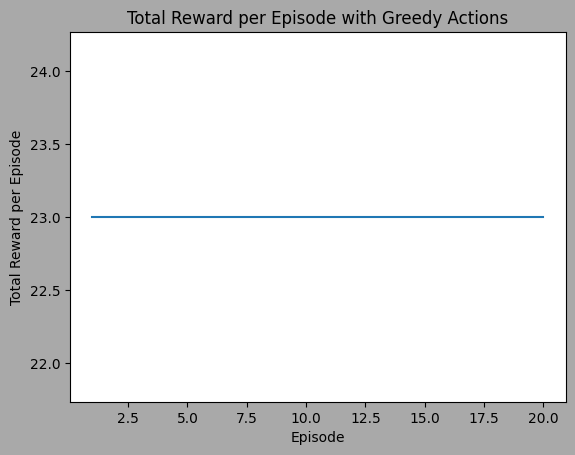

In [260]:
testing( GridEnvironmentwith_cat_cheese(),q_table_deterministic_model6_hyperparam,eps = 20)



**Q- learning for stochasticgrid**

In [261]:
max_timesteps = 45

Streaming output truncated to the last 5000 lines.
greedy
Episode: 223 , Step-count: 5 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 223 , Step-count: 6 , Action taken: random , Reward for this step: 0
random
Episode: 223 , Step-count: 7 , Action taken: random , Reward for this step: 0
random
Episode: 223 , Step-count: 8 , Action taken: random , Reward for this step: 0
random
Episode: 223 , Step-count: 9 , Action taken: random , Reward for this step: 0
random
Episode: 223 , Step-count: 10 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 223 , Step-count: 11 , Action taken: random , Reward for this step: 0
random
Episode: 223 , Step-count: 12 , Action taken: random , Reward for this step: 0
random
Episode: 223 , Step-count: 13 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 223 , Step-count: 14 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 223 , Step-count: 15 , Action taken: greedy , Reward for this step: 0
greedy
E

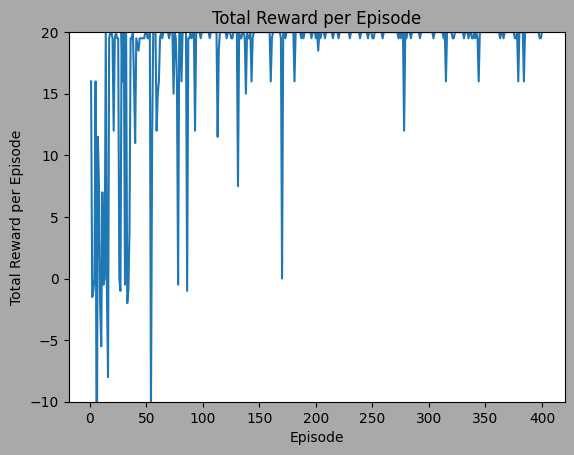

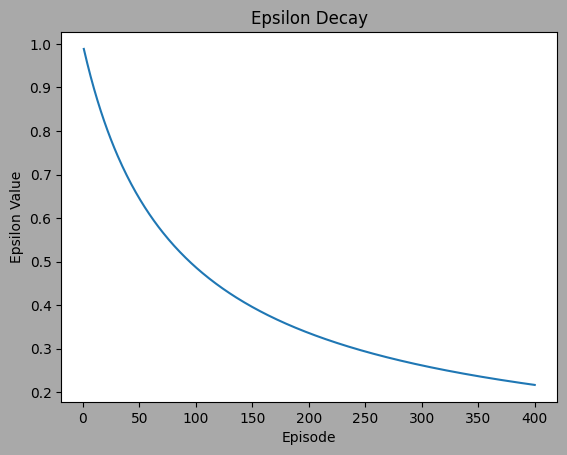

Number of times agent reached the goal state--- 380
Number of times agent ran out of time---- 20
Number of times agent is taking random action [21, 45, 45, 43, 28, 45, 18, 21, 41, 42, 41, 41, 41, 12, 42, 40, 32, 34, 27, 27, 20, 24, 23, 10, 17, 34, 36, 21, 10, 13, 34, 16, 34, 34, 17, 28, 17, 12, 16, 24, 5, 26, 23, 13, 18, 28, 10, 11, 17, 4, 24, 8, 9, 32, 10, 7, 9, 12, 21, 14, 19, 18, 10, 13, 7, 8, 3, 15, 3, 13, 10, 6, 5, 14, 12, 17, 12, 32, 4, 8, 10, 12, 9, 15, 10, 28, 3, 15, 2, 8, 4, 3, 8, 9, 10, 6, 5, 10, 6, 6, 5, 6, 8, 13, 9, 3, 7, 4, 9, 6, 7, 3, 14, 17, 1, 4, 7, 3, 5, 7, 6, 3, 8, 3, 4, 15, 3, 2, 14, 12, 16, 8, 7, 15, 9, 14, 8, 10, 3, 10, 7, 6, 5, 9, 11, 6, 7, 2, 3, 5, 7, 2, 2, 4, 4, 3, 6, 3, 7, 3, 4, 4, 1, 6, 8, 9, 0, 5, 13, 21, 5, 5, 8, 8, 5, 9, 2, 6, 4, 2, 6, 5, 5, 7, 4, 1, 8, 2, 6, 5, 0, 12, 4, 5, 2, 12, 2, 3, 5, 8, 6, 9, 2, 3, 4, 4, 2, 7, 3, 2, 2, 8, 12, 1, 10, 1, 1, 5, 7, 10, 6, 2, 6, 8, 4, 4, 4, 8, 9, 2, 6, 6, 2, 1, 4, 6, 3, 2, 3, 1, 3, 7, 3, 2, 4, 7, 3, 3, 6, 6, 13, 4, 8, 4, 

In [264]:



num_episodes = 400
env = StochasticGridEnvironment()
agent = QLearningAgent(env = StochasticGridEnvironment(), alpha=0.01, gamma=0.9, epsilon=1.0, epsilon_min=0.01, num_of_episodes=400)

rewards_per_epi_ql_stoch = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)

        action,action_taken = agent.choose_action(state)
        if action_taken =="random":
          random_count = random_count+1
        else:
          greedy_count = greedy_count+1

        next_state, reward, done, info = env.step(action)

        #next_state = 0  # for simplicity, assume next state is always 0
        #print(state,action,reward,next_state)

        agent.update_q_table(state, action, reward, next_state)
        total_reward += reward
        state = next_state
        #env.render()


        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi_ql_stoch.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1



# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/q_table_stochastic_model.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)

print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
q_table_stochastic_model = agent.q_table

# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi_ql_stoch)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-10,20)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
print("Number of times agent is taking random action",n_random_action_for_each_episode)
print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)


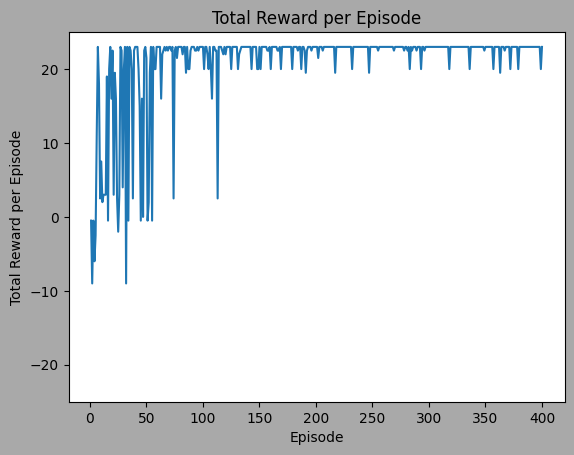

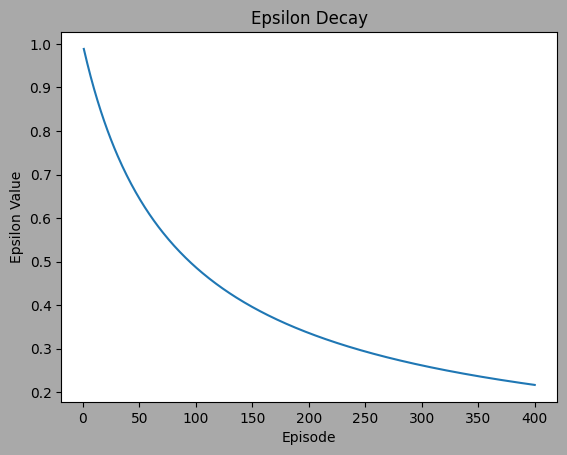

In [267]:
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-25,25)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

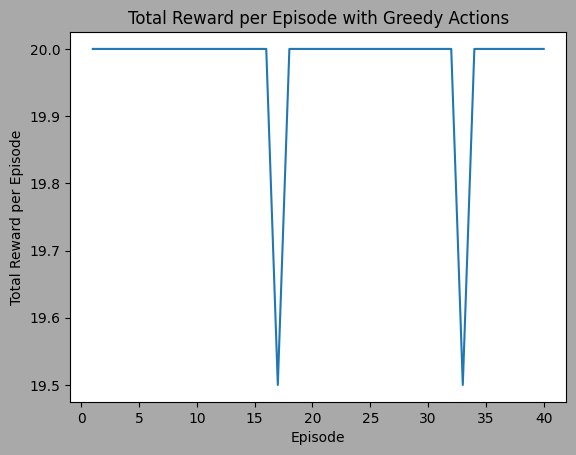

In [268]:
testing( StochasticGridEnvironment(),q_table_stochastic_model,eps = 40)

In [270]:
import optuna


def hyperparameter_tuning(trial):

    alpha = trial.suggest_float('alpha', 0.0001, 0.1)
    gamma = trial.suggest_float('gamma', 0.1,0.99)
    epsilon_min = trial.suggest_float('epsilon_min', 0.001, 0.01)

    agent = QLearningAgent(env = StochasticGridEnvironment(),  gamma=gamma, epsilon_min=epsilon_min,alpha=alpha)


    num_episodes = 400


    for episode in range(num_episodes):
        state = env.reset()
        done = False
        total_reward = 0

        for steps in range(max_timesteps):
            action, _ = agent.choose_action(state)
            next_state, reward, done, _ = env.step(action)
            agent.update_q_table(state, action, reward, next_state)
            total_reward += reward
            state = next_state

            if done:
                break

    return total_reward


grid = optuna.create_study(direction='maximize')
grid.optimize(hyperparameter_tuning, n_trials=100)


top_3_hyperparams = [trial.params for trial in grid.trials[:3]]

print("Top 3 sets of hyperparameters:")
for i, params in enumerate(top_3_hyperparams, 1):
    print(f"Top {i}: {params}")


[I 2024-02-22 19:05:19,641] A new study created in memory with name: no-name-e65b3b42-9790-40a0-bd20-e6554cb68452
[I 2024-02-22 19:05:24,477] Trial 0 finished with value: -3.0 and parameters: {'alpha': 0.03912218503323059, 'gamma': 0.2515913129774113, 'epsilon_min': 0.004795162060062894}. Best is trial 0 with value: -3.0.
[I 2024-02-22 19:05:27,358] Trial 1 finished with value: -1.0 and parameters: {'alpha': 0.0625018329202165, 'gamma': 0.13977415248087738, 'epsilon_min': 0.006259387547775773}. Best is trial 1 with value: -1.0.
[I 2024-02-22 19:05:29,519] Trial 2 finished with value: 11.5 and parameters: {'alpha': 0.037234390844460376, 'gamma': 0.6985234060321781, 'epsilon_min': 0.00324960136287429}. Best is trial 2 with value: 11.5.
[I 2024-02-22 19:05:31,477] Trial 3 finished with value: -1.0 and parameters: {'alpha': 0.005194972871298586, 'gamma': 0.4670002750872364, 'epsilon_min': 0.0034260613750386674}. Best is trial 2 with value: 11.5.
[I 2024-02-22 19:05:34,098] Trial 4 finished

Top 3 sets of hyperparameters:
Top 1: {'alpha': 0.03912218503323059, 'gamma': 0.2515913129774113, 'epsilon_min': 0.004795162060062894}
Top 2: {'alpha': 0.0625018329202165, 'gamma': 0.13977415248087738, 'epsilon_min': 0.006259387547775773}
Top 3: {'alpha': 0.037234390844460376, 'gamma': 0.6985234060321781, 'epsilon_min': 0.00324960136287429}


In [271]:
ls_gamma=[]
ls_eps_min=[]
ls_alpha=[]
ls_eps = []
for i, params in enumerate(top_3_hyperparams, 1):
  for key,value in params.items():
    if key=="gamma":
      ls_gamma.append(value)
    elif key=="epsilon_min":
      ls_eps_min.append(value)
    elif key=="num_eps":
      ls_eps.append(value)
    else:
      ls_alpha.append(value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Hyperparameter - tuning

Streaming output truncated to the last 5000 lines.
how many times an random action or greedy action is taken- random 0 greedy 8
Reward for each episode-------- 20
Episode count 224
Episode: 223 , Step-count: 0 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 223 , Step-count: 1 , Action taken: random , Reward for this step: 0
random
Episode: 223 , Step-count: 2 , Action taken: random , Reward for this step: 0
random
Episode: 223 , Step-count: 3 , Action taken: random , Reward for this step: 0
random
Episode: 223 , Step-count: 4 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 223 , Step-count: 5 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 223 , Step-count: 6 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 223 , Step-count: 7 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 223 , Step-count: 8 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 223 , Step-count: 9 , Action taken: greedy , 

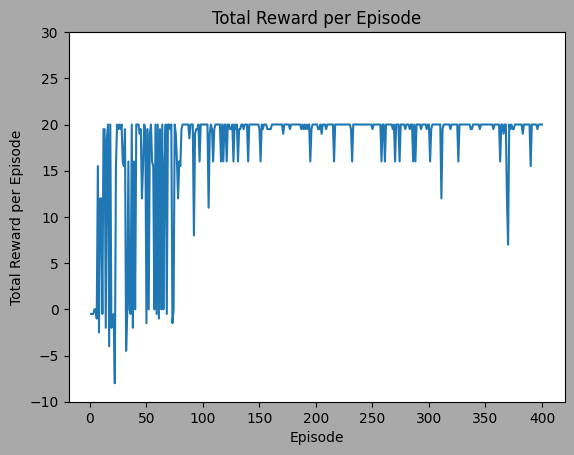

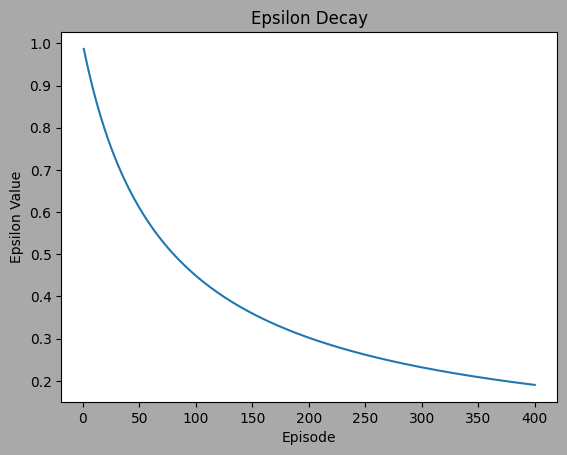

Number of times agent reached the goal state--- 370
Number of times agent ran out of time---- 30
Number of times agent is taking random action [45, 44, 45, 44, 42, 43, 19, 42, 24, 11, 41, 16, 13, 35, 31, 25, 36, 16, 34, 37, 33, 34, 26, 18, 11, 20, 31, 19, 19, 11, 30, 31, 29, 25, 32, 31, 10, 32, 8, 34, 8, 21, 12, 22, 23, 19, 18, 12, 12, 29, 23, 25, 12, 23, 16, 15, 26, 9, 27, 5, 24, 16, 21, 18, 31, 8, 15, 22, 18, 15, 23, 3, 26, 24, 9, 12, 12, 4, 7, 5, 14, 10, 4, 9, 7, 9, 9, 17, 7, 13, 14, 7, 20, 16, 13, 9, 8, 4, 2, 3, 17, 12, 1, 5, 20, 8, 5, 6, 6, 10, 13, 6, 14, 1, 9, 3, 4, 8, 18, 6, 9, 5, 3, 6, 4, 6, 7, 8, 3, 10, 2, 3, 8, 3, 7, 4, 4, 6, 6, 13, 13, 2, 6, 3, 2, 5, 4, 14, 1, 4, 3, 14, 8, 3, 6, 6, 5, 9, 7, 4, 6, 1, 2, 4, 7, 1, 6, 4, 3, 6, 19, 2, 16, 3, 4, 7, 8, 2, 2, 6, 1, 2, 1, 1, 3, 5, 15, 6, 5, 2, 10, 6, 3, 0, 5, 9, 5, 12, 3, 3, 4, 4, 9, 8, 6, 5, 1, 3, 5, 12, 9, 7, 6, 1, 9, 5, 2, 4, 3, 5, 4, 3, 0, 4, 3, 3, 1, 5, 4, 11, 11, 4, 4, 5, 2, 4, 2, 4, 3, 4, 1, 1, 3, 2, 8, 7, 2, 1, 1, 6, 2, 1, 4,

In [272]:

num_episodes = 400
env = StochasticGridEnvironment()
#agent = QLearningAgent(env = StochasticGridEnvironment(), alpha=0.01, gamma=0.7, epsilon=1.0,epsilon_min=0.01)
#env = StochasticGridEnvironment(), alpha=0.04, gamma=ls_gamma[0], epsilon=1.0,  num_of_episodes=ls_eps[0]
agent = QLearningAgent(env = StochasticGridEnvironment(), alpha=0.04, gamma=ls_gamma[0], epsilon=1.0,  num_of_episodes=400,epsilon_min = ls_eps_min[0])

rewards_per_epi = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)

        action,action_taken = agent.choose_action(state)
        if action_taken =="random":
          random_count = random_count+1
        else:
          greedy_count = greedy_count+1

        next_state, reward, done, info = env.step(action)
        agent.update_q_table(state, action, reward, next_state)

        total_reward += reward
        state = next_state



        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1



# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/q_table_stochastic_model_hyperparam.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)

print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
q_table_stochastic_model_hyperparam = agent.q_table

# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-10,30)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
print("Number of times agent is taking random action",n_random_action_for_each_episode)
print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)


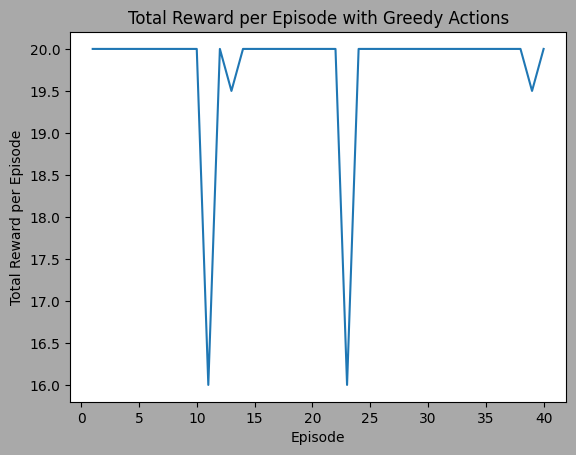

In [273]:
testing( StochasticGridEnvironment(),q_table_stochastic_model_hyperparam,eps = 40)

**PART - 2**



**2.2**

SARSA Agent

In [419]:
import numpy as np
import random
import pickle
import matplotlib.pyplot as plt

class SARSA_Agent:
    def __init__(self, env, alpha=0.01, gamma=0.8, epsilon=1.0, epsilon_min=0.01, num_of_episodes=400):
        self.env = env
        self.alpha = alpha  # Learning rate
        self.gamma = gamma  # Discount factor
        self.epsilon = epsilon  # Exploration rate
        self.epsilon_min = epsilon_min
        self.num_of_episodes = num_episodes
        self.q_table = np.zeros((self.env.observation_space.n, self.env.action_space.n))
        self.epsilon_history = []

    def choose_action(self, state):
        q_state = self.q_table[state]
        random_action = np.random.choice(self.env.action_space.n)
        greedy_action = np.argmax(q_state)
        #which_action_is_taken = " "

        if np.random.rand() < self.epsilon:
            #which_action_is_taken ="random"
            #print(random_action, which_action_is_taken)
            return random_action
        else:
            #which_action_is_taken ="greedy"
            #print(random_action, which_action_is_taken)
            return greedy_action

    def update_q_table(self, state, action, reward, next_state):


        target = reward + self.gamma * (self.q_table[next_state,action])
        q_value = target - self.q_table[state, action]
        self.q_table[state, action] += self.alpha * q_value

    def decay_epsilon(self):

        decay_factor = (self.epsilon_min / self.epsilon) ** (self.epsilon / self.num_of_episodes)
        self.epsilon *= decay_factor
        self.epsilon_history.append(self.epsilon)



Streaming output truncated to the last 5000 lines.
Reward for each episode-------- 23
Episode count 221
Episode: 220 , Step-count: 0 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 220 , Step-count: 1 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 220 , Step-count: 2 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 220 , Step-count: 3 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 220 , Step-count: 4 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 220 , Step-count: 5 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 220 , Step-count: 6 , Action taken: greedy , Reward for this step: 3
greedy
Episode: 220 , Step-count: 7 , Action taken: greedy , Reward for this step: 0
greedy
Episode: 220 , Step-count: 8 , Action taken: greedy , Reward for this step: 20
greedy
Reward for each episode-------- 23
Episode count 222
Episode: 221 , Step-count: 0 , Action taken: greedy , Reward for this step: 0

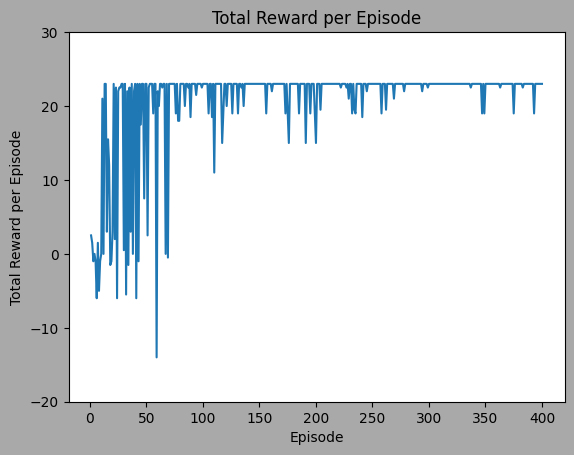

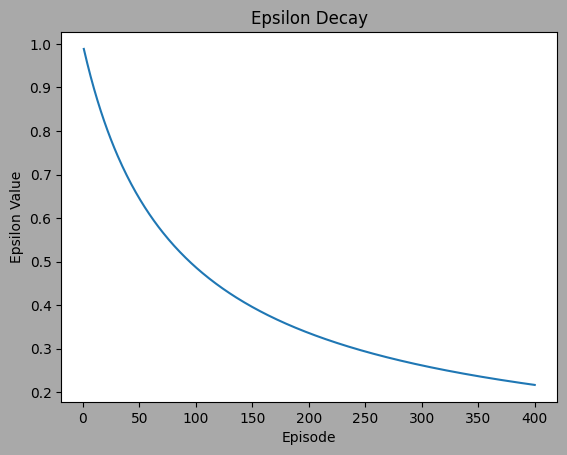

Number of times agent reached the goal state--- 373
Number of times agent ran out of time---- 27


In [444]:


num_episodes = 400

env = GridEnvironmentwith_cat_cheese()
agent = SARSA_Agent(env = StochasticGridEnvironment(),gamma = 0.55,alpha=0.01,epsilon=1.0, epsilon_min=0.01,num_of_episodes=num_episodes)
# Training loop

rewards_per_epi_sarsa_stoch = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0

    action = agent.choose_action(state)
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)
        next_state, reward, done, info = env.step(action)
        action_ = agent.choose_action(state)
        agent.update_q_table(state, action, reward, next_state)
        state = next_state
        action = action_

        total_reward += reward
        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    #print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi_sarsa_stoch.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1



# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/SARSA_q_table_deterministic_model.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)

print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
sarsa_table_deterministic_model_ = agent.q_table

# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi_sarsa_stoch)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-20,30)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
#print("Number of times agent is taking random action",n_random_action_for_each_episode)
#print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)


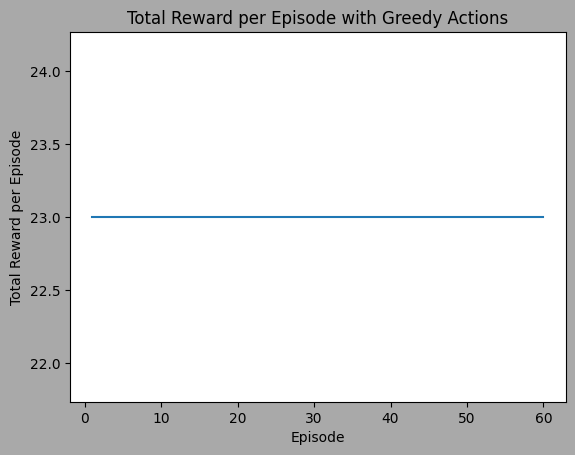

In [428]:
testing(GridEnvironmentwith_cat_cheese(),sarsa_table_deterministic_model_,eps = 60)


**Stochastic ENV**

In [ ]:


num_episodes = 400

env = StochasticGridEnvironment()

agent = SARSA_Agent(env = StochasticGridEnvironment(),gamma = 0.55,alpha=0.01,epsilon=1.0, epsilon_min=0.01,num_of_episodes=num_episodes)
# Training loop

rewards_per_epi_sarsa_stoch = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0

    action = agent.choose_action(state)
    for steps in range(max_timesteps):
        #step_count=step_count+1
        #print("STEP COUNT",step_count)
        next_state, reward, done, info = env.step(action)
        action_ = agent.choose_action(state)
        agent.update_q_table(state, action, reward, next_state)
        state = next_state
        action = action_

        total_reward += reward
        print("Episode:", episode, ", Step-count:", steps, ", Action taken:", action_taken, ", Reward for this step:", reward)

        #print(total_reward)
        print(action_taken)
        if done:
          break
    #print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)

    print("Reward for each episode--------",total_reward)
    rewards_per_epi_sarsa_stoch.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == max_timesteps:
      n_ran_out_time = n_ran_out_time+1



# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/SARSA_q_table_stochastic_model.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)

print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
sarsa_table_stochastic_model = agent.q_table

# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi_sarsa_stoch)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-20,30)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

print("Number of times agent reached the goal state---",n_reached_gstate)
print("Number of times agent ran out of time----",n_ran_out_time)
#print("Number of times agent is taking random action",n_random_action_for_each_episode)
#print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)


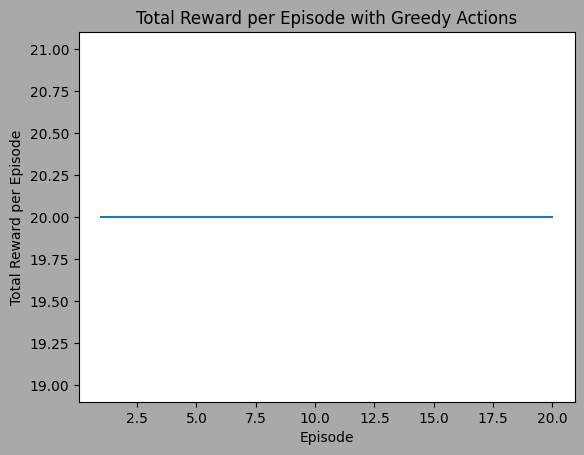

In [447]:
testing(StochasticGridEnvironment(),sarsa_table_stochastic_model,eps=20)

**Comparing graphs of q-learning and sarsa rewards (Determinstic Environment)**

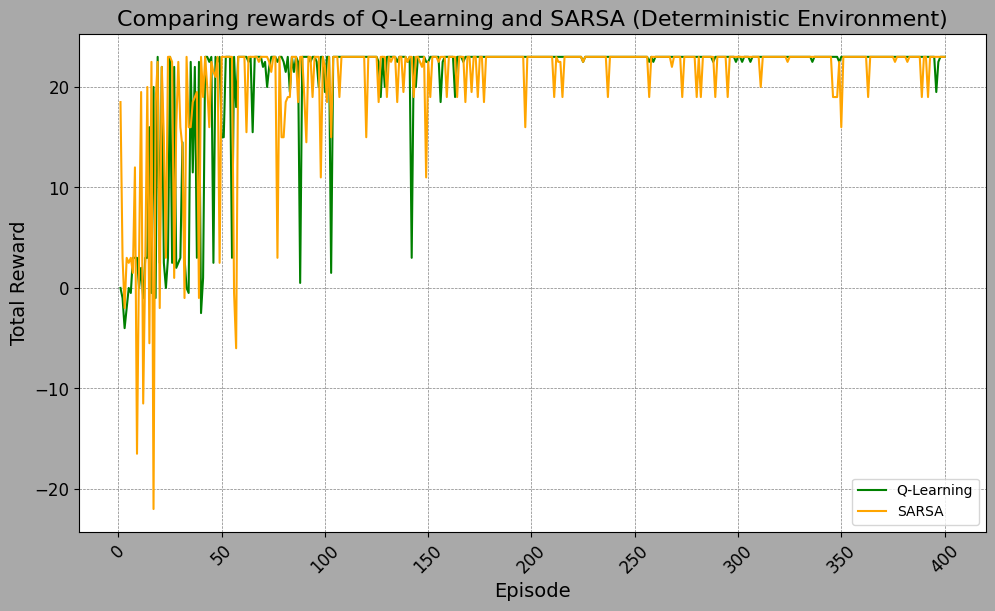

In [281]:
import matplotlib.pyplot as plt

# Define colors for the plots
ql_color = 'green'
sarsa_color = 'orange'





plt.figure(figsize=(10, 6))
plt.plot(range(1, num_episodes + 1), rewards_per_epi_ql_deter, label='Q-Learning', color=ql_color)
plt.plot(range(1, num_episodes + 1), rewards_per_epi_sarsa_deter, label="SARSA", color=sarsa_color)
plt.title('Comparing rewards of Q-Learning and SARSA (Deterministic Environment)', fontsize=16)
plt.xlabel('Episode', fontsize=14)
plt.ylabel('Total Reward', fontsize=14)
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()


plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)


plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')


plt.show()


**Stochastic Environment**

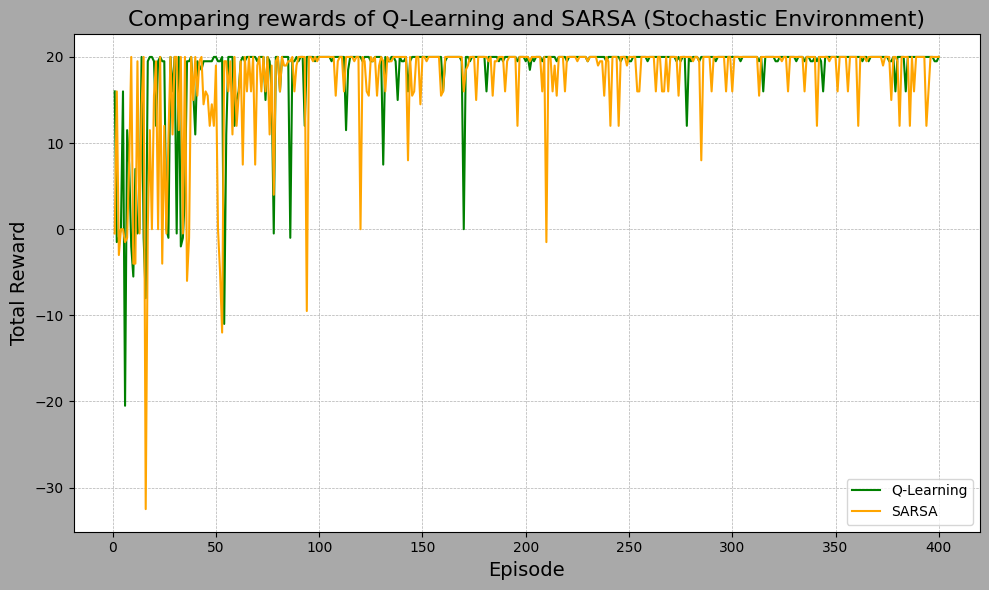

In [282]:
ql_color = 'green'
sarsa_color = 'orange'
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_episodes + 1), rewards_per_epi_ql_stoch, label='Q-Learning', color=ql_color)
plt.plot(range(1, num_episodes + 1), rewards_per_epi_sarsa_stoch, label="SARSA", color=sarsa_color)
plt.title('Comparing rewards of Q-Learning and SARSA (Stochastic Environment)', fontsize=16)
plt.xlabel('Episode', fontsize=14)
plt.ylabel('Total Reward', fontsize=14)
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

**PART - 3 Stock Trading Environment**

In [284]:
# Defining the Stock Trading Environment.
"""DON'T MAKE ANY CHANGES TO THE ENVIRONMENT."""


class StockTradingEnvironment(gymnasium.Env):
    """This class implements the Stock Trading environment."""

    def __init__(self, file_path, train=True, number_of_days_to_consider=10):
        """This method initializes the environment.

        :param file_path: - Path of the CSV file containing the historical stock data.
        :param train: - Boolean indicating whether the goal is to train or test the performance of the agent.
        :param number_of_days_to_consider = Integer representing the number of days the for which the agent
                considers the trend in stock price to make a decision."""

        self.file_path = file_path
        self.stock_data = pd.read_csv(self.file_path)
        self.train = train

        # Splitting the data into train and test datasets.
        self.training_stock_data = self.stock_data.iloc[:int(0.8 * len(self.stock_data))]
        self.testing_stock_data = self.stock_data.iloc[int(0.8 * len(self.stock_data)):].reset_index()

        self.observation_space = spaces.Discrete(4)
        self.action_space = spaces.Discrete(3)

        self.investment_capital = 100000  # This defines the investment capital that the agent starts with.
        self.number_of_shares = 0  # This defines number of shares currently held by the agent.
        self.stock_value = 0  # This defines the value of the stock currently held by the agent.
        self.book_value = 0  # This defines the total value for which the agent bought the shares.
        # This defines the agent's total account value.
        self.total_account_value = self.investment_capital + self.stock_value
        # List to store the total account value over training or evaluation.
        self.total_account_value_list = []
        # This defines the number of days for which the agent considers the data before taking an action.
        self.number_of_days_to_consider = number_of_days_to_consider
        # The maximum timesteps the agent will take before the episode ends.
        if self.train:
            self.max_timesteps = len(self.training_stock_data) - self.number_of_days_to_consider
        else:
            self.max_timesteps = len(self.testing_stock_data) - self.number_of_days_to_consider
        # Initializing the number of steps taken to 0.
        self.timestep = 0
        self.reset()

    def reset(self):
        """This method resets the environment and returns the observation.

        :returns observation: - Integer in the range of 0 to 3 representing the four possible observations that the
                                agent can receive. The observation depends upon whether the price increased on average
                                in the number of days the agent considers, and whether the agent already has the stock
                                or not.

                 info: - info: - A dictionary that can be used to provide additional implementation information."""

        self.investment_capital = 100000  # This defines the investment capital that the agent starts with.
        self.number_of_shares = 0  # This defines number of shares currently held by the agent.
        self.stock_value = 0  # This defines the value of the stock currently held by the agent.
        self.book_value = 0  # This defines the total value for which the agent bought the shares.
        # This defines the agent's total account value.
        self.total_account_value = self.investment_capital + self.stock_value
        # List to store the total account value over training or evaluation.
        self.total_account_value_list = []
        # Initializing the number of steps taken to 0.
        self.timestep = 0

        # Getting the observation vector.
        if self.train:
            # If the task is to train the agent the maximum timesteps will be equal to the number of days considered
            # subtracted from the  length of the training stock data.
            self.max_timesteps = len(self.training_stock_data) - self.number_of_days_to_consider

            # Calculating whether the price increased or decreased/remained the same on the majority of days the agent
            # considers.
            price_increase_list = []
            for i in range(self.number_of_days_to_consider):
                if self.training_stock_data['Close'][self.timestep + 1 + i] \
                        - self.training_stock_data['Close'][self.timestep + i] > 0:
                    price_increase_list.append(1)
                else:
                    price_increase_list.append(0)

            if (np.sum(price_increase_list) / self.number_of_days_to_consider) >= 0.5:
                price_increase = True
            else:
                price_increase = False

            stock_held = False

            # Observation vector that will be passed to the agent.
            observation = [price_increase, stock_held]

        else:
            # If the task is to evaluate the trained agent's performance the maximum timesteps will be equal to the
            # number of days considered subtracted from the  length of the testing stock data.
            self.max_timesteps = len(self.testing_stock_data) - self.number_of_days_to_consider

            # Calculating whether the price increased or decreased/remained the same on the majority of days the agent
            # considers.
            price_increase_list = []
            for i in range(self.number_of_days_to_consider):
                if self.testing_stock_data['Close'][self.timestep + 1 + i] \
                        - self.testing_stock_data['Close'][self.timestep + i] > 0:
                    price_increase_list.append(1)
                else:
                    price_increase_list.append(0)

            if (np.sum(price_increase_list) / self.number_of_days_to_consider) >= 0.5:
                price_increase = True
            else:
                price_increase = False

            stock_held = False

            # Observation vector.
            observation = [price_increase, stock_held]

        if np.array_equal(observation, [True, False]):
            observation = 0
        if np.array_equal(observation, [True, True]):
            observation = 1
        if np.array_equal(observation, [False, False]):
            observation = 2
        if np.array_equal(observation, [False, True]):
            observation = 3

        info = None

        return observation, info

    def step(self, action):
        """This method implements what happens when the agent takes the action to Buy/Sell/Hold.

        :param action: - Integer in the range 0 to 2 inclusive.

        :returns observation: - Integer in the range of 0 to 3 representing the four possible observations that the
                                agent can receive. The observation depends upon whether the price increased on average
                                in the number of days the agent considers, and whether the agent already has the stock
                                or not.
                 reward: - Integer/Float value that's used to measure the performance of the agent.
                 terminated: - Boolean describing whether the episode has terminated.
                 truncated: - Boolean describing whether a truncation condition outside the scope of the MDP is satisfied.
                 info: - A dictionary that can be used to provide additional implementation information."""

        # We give the agent a penalty for taking actions such as buying a stock when the agent doesn't have the
        # investment capital and selling a stock when the agent doesn't have any shares.
        penalty = 0

        if self.train:
            if action == 0:  # Buy
                if self.number_of_shares > 0:
                    penalty = -10
                # Determining the number of shares the agent can buy.
                number_of_shares_to_buy = math.floor(self.investment_capital / self.training_stock_data[
                    'Open'][self.timestep + self.number_of_days_to_consider])
                # Adding to the number of shares the agent has.
                self.number_of_shares += number_of_shares_to_buy

                # Computing the stock value, book value, investment capital and reward.
                if number_of_shares_to_buy > 0:
                    self.stock_value +=\
                        self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * number_of_shares_to_buy
                    self.book_value += \
                        self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider]\
                        * number_of_shares_to_buy
                    self.investment_capital -= \
                        self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * number_of_shares_to_buy

                    reward = 1 + penalty

                else:
                    # Computing the stock value and reward.
                    self.stock_value = \
                        self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * self.number_of_shares
                    reward = -10

            if action == 1:  # Sell
                # Computing the investment capital, sell value and reward.
                self.investment_capital += \
                    self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                    * self.number_of_shares
                sell_value = self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                             * self.number_of_shares

                if self.book_value > 0:
                    reward = (sell_value - self.book_value) / self.book_value * 100
                else:
                    reward = -10

                self.number_of_shares = 0
                self.stock_value = 0
                self.book_value = 0

            if action == 2:  # Hold
                # Computing the stock value and reward.
                self.stock_value = self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                                   * self.number_of_shares

                if self.book_value > 0:
                    reward = (self.stock_value - self.book_value) / self.book_value * 100
                else:
                    reward = -1

        else:
            if action == 0:  # Buy
                if self.number_of_shares > 0:
                    penalty = -10
                # Determining the number of shares the agent can buy.
                number_of_shares_to_buy = math.floor(self.investment_capital / self.testing_stock_data[
                    'Open'][self.timestep + self.number_of_days_to_consider])
                # Adding to the number of shares the agent has.
                self.number_of_shares += number_of_shares_to_buy

                # Computing the stock value, book value, investment capital and reward.
                if number_of_shares_to_buy > 0:
                    self.stock_value += \
                        self.testing_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * number_of_shares_to_buy
                    self.book_value += \
                        self.testing_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * number_of_shares_to_buy
                    self.investment_capital -= \
                        self.testing_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * number_of_shares_to_buy

                    reward = 1 + penalty

                else:
                    # Computing the stock value and reward.
                    self.stock_value = self.training_stock_data['Open'][
                                           self.timestep + self.number_of_days_to_consider] * self.number_of_shares
                    reward = -10

            if action == 1:  # Sell
                # Computing the investment capital, sell value and reward.
                self.investment_capital += \
                    self.testing_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                    * self.number_of_shares
                sell_value = self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                             * self.number_of_shares

                if self.book_value > 0:
                    reward = (sell_value - self.book_value) / self.book_value * 100
                else:
                    reward = -10

                self.number_of_shares = 0
                self.stock_value = 0
                self.book_value = 0

            if action == 2:  # Hold
                # Computing the stock value and reward.
                self.stock_value = self.testing_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                                   * self.number_of_shares

                if self.book_value > 0:
                    reward = (self.stock_value - self.book_value) / self.book_value * 100
                else:
                    reward = -1

        # Determining if the agent currently has shares of the stock or not.
        if self.number_of_shares > 0:
            stock_held = True
        else:
            stock_held = False

        # Getting the observation vector.
        if self.train:
            # If the task is to train the agent the maximum timesteps will be equal to the number of days considered
            # subtracted from the  length of the training stock data.
            self.max_timesteps = len(self.training_stock_data) - self.number_of_days_to_consider

            # Calculating whether the price increased or decreased/remained the same on the majority of days the agent
            # considers.
            price_increase_list = []
            for i in range(self.number_of_days_to_consider):
                if self.training_stock_data['Close'][self.timestep + 1 + i] \
                        - self.training_stock_data['Close'][self.timestep + i] > 0:
                    price_increase_list.append(1)
                else:
                    price_increase_list.append(0)

            if (np.sum(price_increase_list) / self.number_of_days_to_consider) >= 0.5:
                price_increase = True
            else:
                price_increase = False

            # Observation vector.
            observation = [price_increase, stock_held]

        else:
            # If the task is to evaluate the trained agent's performance the maximum timesteps will be equal to the
            # number of days considered subtracted from the  length of the testing stock data.
            self.max_timesteps = len(self.testing_stock_data) - self.number_of_days_to_consider

            # Calculating whether the price increased or decreased/remained the same on the majority of days the agent
            # considers.
            price_increase_list = []
            for i in range(self.number_of_days_to_consider):
                if self.testing_stock_data['Close'][self.timestep + 1 + i] \
                        - self.testing_stock_data['Close'][self.timestep + i] > 0:
                    price_increase_list.append(1)
                else:
                    price_increase_list.append(0)

            if (np.sum(price_increase_list) / self.number_of_days_to_consider) >= 0.5:
                price_increase = True
            else:
                price_increase = False

            # Observation vector.
            observation = [price_increase, stock_held]

        self.timestep += 1  # Increasing the number of steps taken by the agent by 1.

        if np.array_equal(observation, [True, False]):
            observation = 0
        if np.array_equal(observation, [True, True]):
            observation = 1
        if np.array_equal(observation, [False, False]):
            observation = 2
        if np.array_equal(observation, [False, True]):
            observation = 3

        # Computing the total account value.
        self.total_account_value = self.investment_capital + self.stock_value
        # Appending the total account value of the list to plot the graph.
        self.total_account_value_list.append(self.total_account_value)

        # The episode terminates when the maximum timesteps have been reached.
        terminated = True if (self.timestep >= self.max_timesteps) \
            else False
        truncated = False
        info = {}

        return observation, reward, terminated, truncated, info

    def render(self, mode='human'):
        """This method renders the agent's total account value over time.

        :param mode: 'human' renders to the current display or terminal and returns nothing."""

        plt.figure(figsize=(15, 10))
        plt.plot(self.total_account_value_list, color='lightseagreen', linewidth=7)
        plt.xlabel('Days', fontsize=32)
        plt.ylabel('Total Account Value', fontsize=32)
        plt.title('Total Account Value over Time', fontsize=38)
        plt.grid()
        plt.show()

In [285]:


# NOTE: You can adjust the parameter 'number_of_days_to_consider'

stock_trading_environment = StockTradingEnvironment('/content/drive/MyDrive/RL - assnmt_1_checkpoint_1/NVDA.csv', number_of_days_to_consider=50)

Episode count 1
Reward for each episode-------- -1213.3195422192373
Info about shares
investment_captial :  66446.62067400002 , number_of_shares : 0 , stock_value:  0 , book_value:  0 , total_account_valu- 66446.62067400002
************************************************************************************************************************************************************************************************************************************************************************************************************
End of each episode --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Episode count 2
Reward for each episode-------- -1026.299639206288
Info about shares
investment_captial 

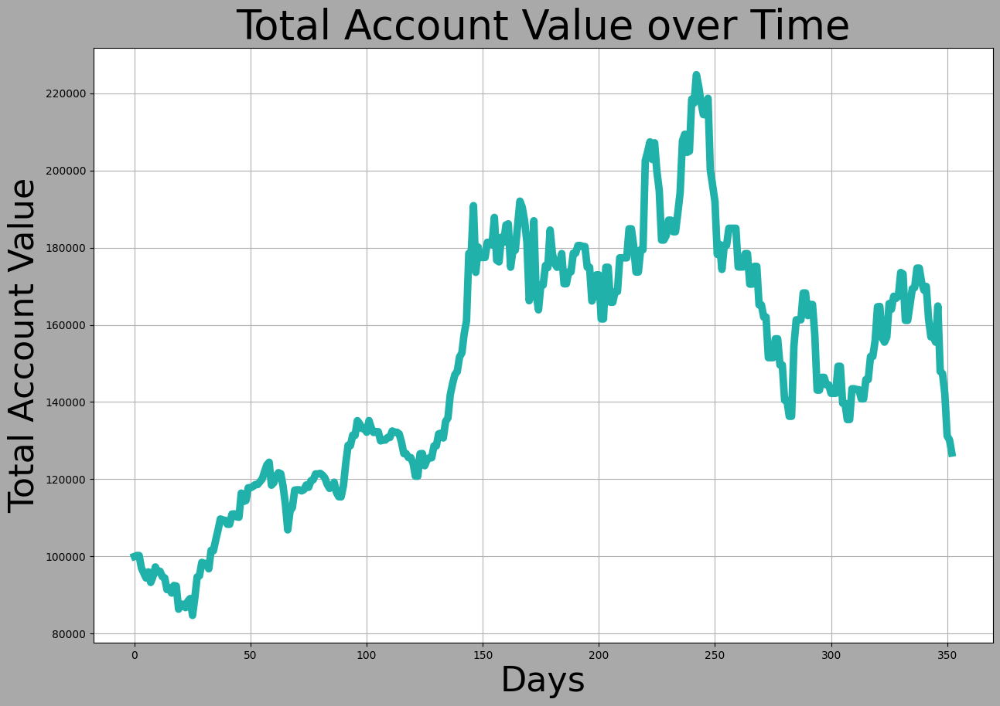

Initial Q-table:
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]

Trained Q-table:
[[23.47600348  7.88822597 17.41826391]
 [13.87185128 21.87899313 29.3632144 ]
 [ 8.77965232 -2.65132917  6.55282361]
 [-3.03759515  7.56963054  6.1025623 ]]


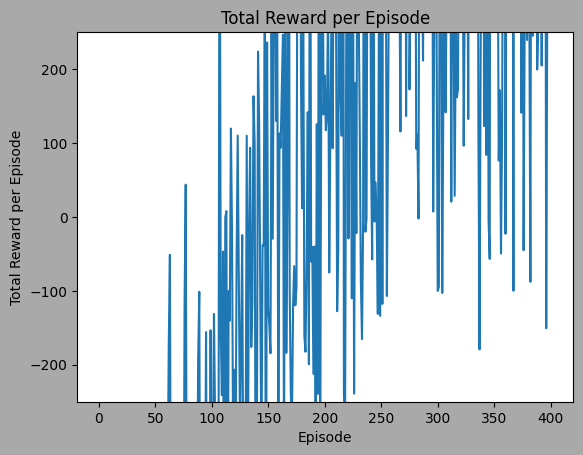

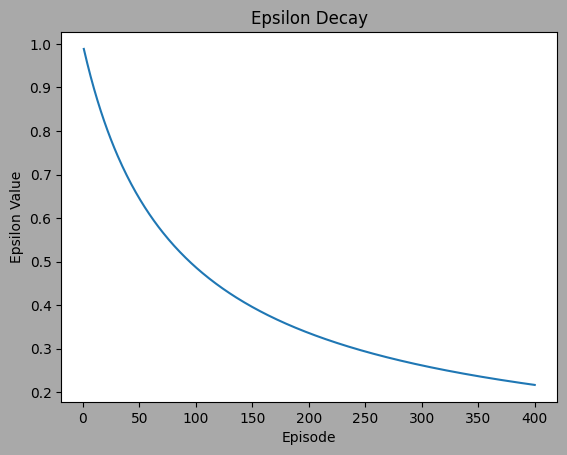

In [296]:


import numpy as np
import random
import pickle
import matplotlib.pyplot as plt

class QLearningAgent:
    def __init__(self, env, alpha=0.01, gamma=0.85, epsilon=1.0, epsilon_min=0.01,num_of_episodes=300):
        self.env = env
        self.alpha = alpha  # Learning rate
        self.gamma = gamma  # Discount factor
        self.epsilon = epsilon  # Exploration rate
        self.epsilon_min = epsilon_min

        self.num_episodes = num_of_episodes
        self.q_table = np.zeros((self.env.observation_space.n, self.env.action_space.n))
        self.epsilon_history = []

    def choose_action(self, state):
        q_state = self.q_table[state]
        random_action = np.random.choice(self.env.action_space.n)
        greedy_action = np.argmax(q_state)
        #which_action_is_taken = " "

        if np.random.rand() < self.epsilon:
            #which_action_is_taken ="random"
            #print(random_action, which_action_is_taken)
            return random_action
        else:
            #which_action_is_taken ="greedy"
            #print(random_action, which_action_is_taken)
            return greedy_action
    def update_q_table(self, state, action, reward, next_state):
      target = reward + self.gamma * np.max(self.q_table[next_state])
      q_value = target - self.q_table[state, action]
      self.q_table[state, action] += self.alpha * q_value

    def decay_epsilon(self):
      decay_factor = (self.epsilon_min / self.epsilon) ** (self.epsilon / self.num_episodes)
      self.epsilon *= decay_factor
      self.epsilon_history.append(self.epsilon)

# Initialize environment and agent

num_episodes = 400
env = stock_trading_environment
agent = QLearningAgent(env,num_of_episodes=num_episodes)
# Training loop

rewards_per_epi = []
n_reached_gstate = 0
n_ran_out_time = 0
n_random_action_for_each_episode=[]
n_greedy_actionfor_each_episode = []

eps_count=0

for episode in range(num_episodes):
    state,_ = env.reset()

    done = False
    total_reward = 0
    eps_count=eps_count+1
    print("Episode count",eps_count)
    step_count = 0
    random_count=0
    greedy_count =0
    for steps in range(env.max_timesteps):
        #env.render()
        #step_count=step_count+1
        #print("STEP COUNT",step_count)

        action = agent.choose_action(state)

        #next_state, reward, truncated,terminated, info = env.step(action)
        #agent.update_q_table(state, action, reward, next_state)
        next_state, reward, truncated, terminated, info = env.step(int(action))
        agent.update_q_table(int(state), int(action), reward, int(next_state))


        total_reward += reward
        state = next_state
        #env.render()


        #print("Episode:", episode, ", Step-count:", steps,  ", Reward for this step:", reward)
        #print("Info about shares")
        #print("investment_captial : ",env.investment_capital,", number_of_shares :",env.number_of_shares,", stock_value: ",env.stock_value,", book_value: ",env.book_value,", total_account_valu-",env.total_account_value)
        #print("***"*100)
        #print(total_reward)
        #print(action_taken)
        if done:
          break
    #print("how many times an random action or greedy action is taken- random",random_count,"greedy",greedy_count)
    #env.render()
    print("Reward for each episode--------",total_reward)
    print("Info about shares")
    print("investment_captial : ",env.investment_capital,", number_of_shares :",env.number_of_shares,", stock_value: ",env.stock_value,", book_value: ",env.book_value,", total_account_valu-",env.total_account_value)
    print("***"*100)
    print("End of each episode","-"*350)
    rewards_per_epi.append(total_reward)
    agent.decay_epsilon()
    n_random_action_for_each_episode.append(random_count)
    n_greedy_actionfor_each_episode.append(greedy_count)

    if done == True and env.timestep < env.max_timesteps:
      n_reached_gstate= n_reached_gstate+1

    elif done==True and env.timestep == env.max_timesteps:
      n_ran_out_time = n_ran_out_time+1


env.render()
# Save trained Q-table
with open("/content/drive/MyDrive/RL_models/stock_trading_q_table_model.pickle", "wb") as f:
    pickle.dump(agent.q_table, f)

print("Initial Q-table:")
print(np.zeros((env.observation_space.n, env.action_space.n)))

print("\nTrained Q-table:")
print(agent.q_table)
stock_trading_q_table_model = agent.q_table

# Plot total reward per episode
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-250,250)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

#print("Number of times agent reached the goal state---",n_reached_gstate)
#print("Number of times agent ran out of time----",n_ran_out_time)
#print("Number of times agent is taking random action",n_random_action_for_each_episode)
#print("Number of times agent is taking greedy action",n_greedy_actionfor_each_episode)


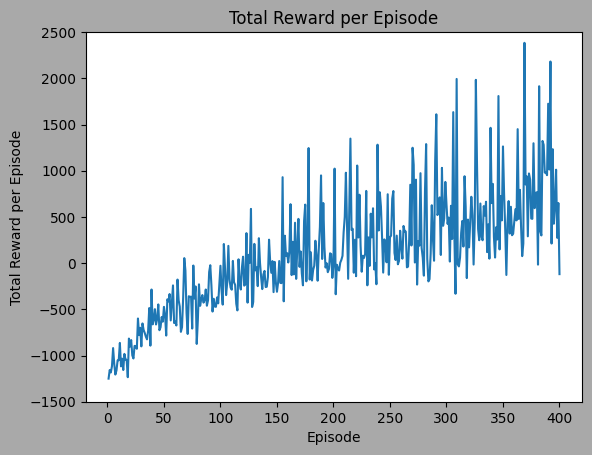

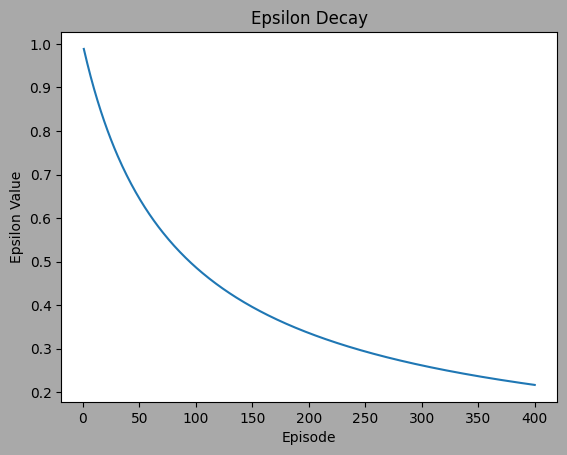

In [291]:
plt.plot(range(1, num_episodes + 1), rewards_per_epi)
plt.xlabel("Episode")
plt.ylabel("Total Reward per Episode")
plt.ylim(-1500,2500)
plt.title("Total Reward per Episode")
plt.show()
plt.plot(range(1, num_episodes + 1), agent.epsilon_history)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay")
plt.show()

Total Reward on Testing Data: 871.0187147810346
Total Account Value: 189675.4330099999


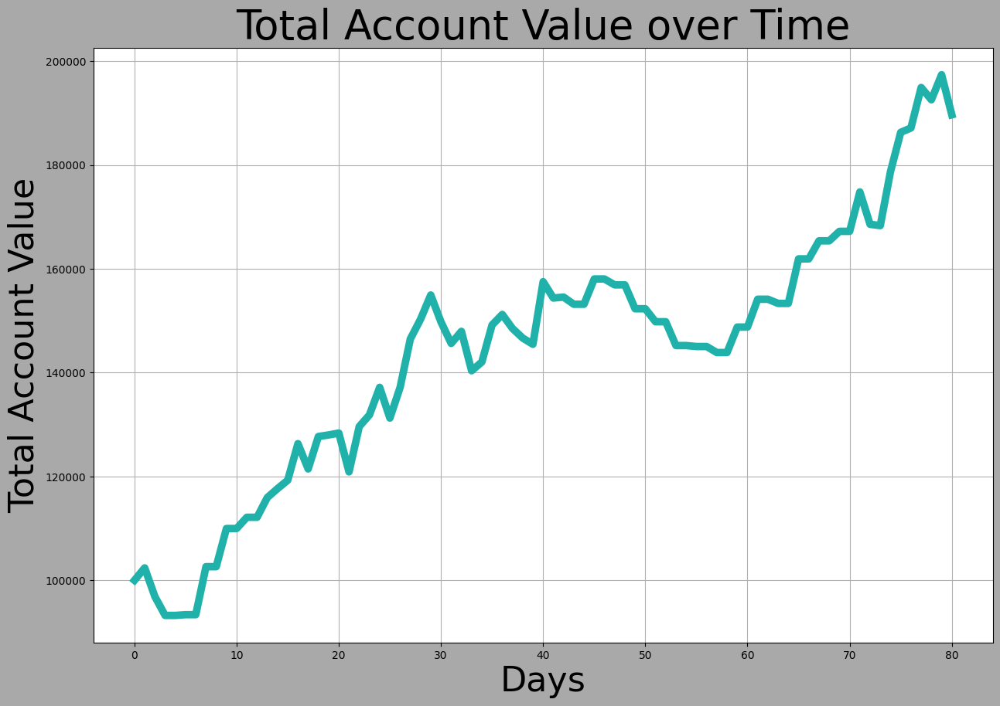

In [306]:
def testing( env,Q_table):


    total_reward_test = 0
    state = env.reset()[0]
    done = False

    while not done:
        action = np.argmax(Q_table[state])
        next_state, reward, done, _, _ = env.step(action)
        total_reward_test += reward
        state = next_state

    print("Total Reward on Testing Data:", total_reward_test)
    print("Total Account Value:", env.total_account_value)


    env.render()

testing( StockTradingEnvironment('/content/drive/MyDrive/RL - assnmt_1_checkpoint_1/NVDA.csv',train=False, number_of_days_to_consider=20),stock_trading_q_table_model)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


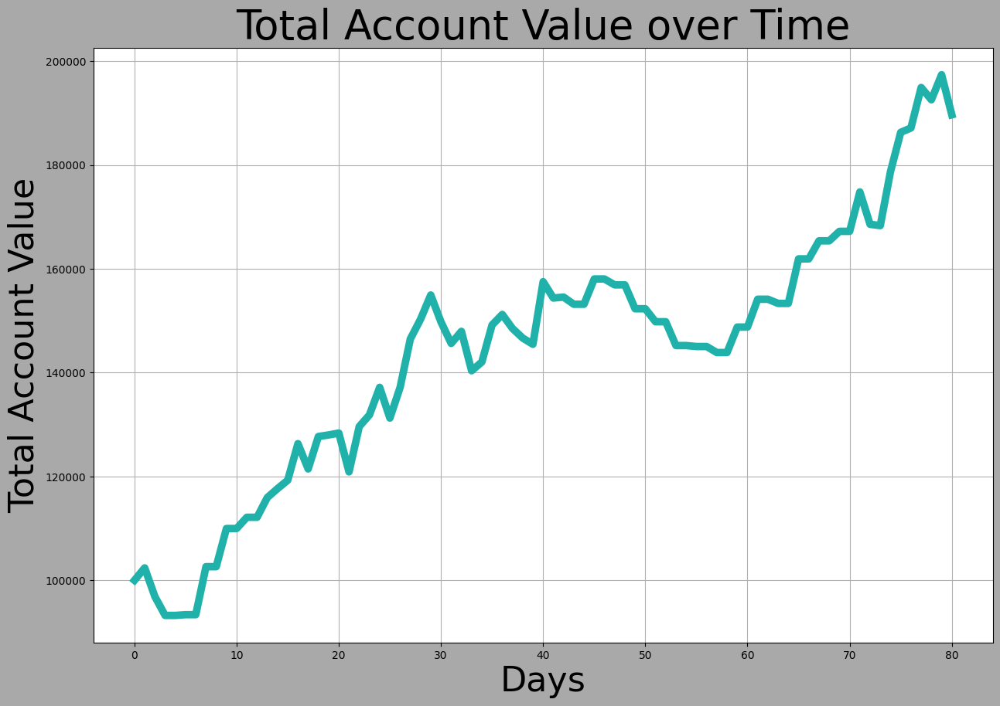

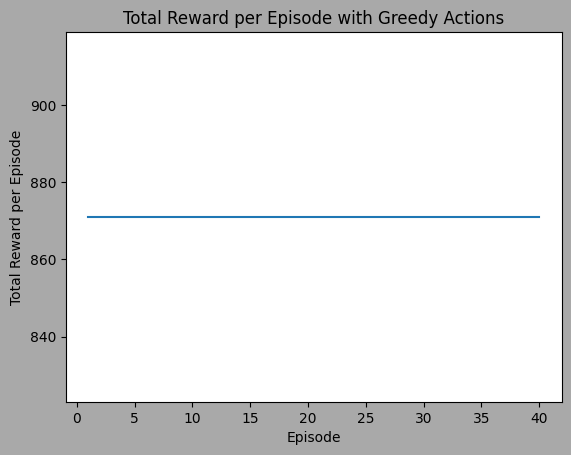

In [289]:
def testing(env,Q_table,eps=20):

  rewards_per_episode_greedy = []
  for episode in range(eps):
    state = env.reset()[0]
    done = False
    total_reward = 0

    while not done:
      q_state = Q_table[state]
      greedy_action = np.argmax(q_state)
      #print(greedy_action)
      #print(Q_table)
      next_state, reward, done,_,_ = env.step(greedy_action)
      total_reward += reward
      state = next_state



    rewards_per_episode_greedy.append(total_reward)
  env.render()
  plt.plot(range(1, eps + 1), rewards_per_episode_greedy)
  plt.xlabel("Episode")
  plt.ylabel("Total Reward per Episode")
  plt.title("Total Reward per Episode with Greedy Actions")
  plt.show()
testing( StockTradingEnvironment('/content/drive/MyDrive/RL - assnmt_1_checkpoint_1/NVDA.csv',train=False, number_of_days_to_consider=20),stock_trading_q_table_model,eps=40)


Referecnes:


1 - https://optuna.org/


2- https://huggingface.co/learn/deep-rl-course/unit1/rl-framework


3- https://gymnasium.farama.org/


4 - https://piazza.com/class/lrscby50k3t3ro/
